# ECON 148 Final Project Template



### Group 6 Members:
_Fatima Gordon, Hannah Hansraj, Michelle Anne Austria, Michelle Maldonado, Qili Zhang, Sofia Belhouari_

**Project Github**: https://github.com/michelleaustriaa/econ148project/upload/main
**Project Slides**: https://docs.google.com/presentation/d/1ealDxg1nfyqeFqU44R9aG62_hly27MltXNhX5CKUREU/edit?usp=sharing

## Source Data - Opportunity Insights

In order to make the project consistent across teams, we are limiting the project to a specific set of datasets that are linked to economics journal articles.  

Browse and choose one of the datasets from (https://opportunityinsights.org/data/). You will find them neatly presented (and mostly cleaned) together with the title of the corresponding research paper.

You should start by reading the corresponding paper, and start your analysis by exploring some of the claims or analysis that you find in the paper (it is not your goal to fully replicate the analysis in the paper). You should then propose some new analysis that you can do with the dataset.


## Abstract
Our project investigates the application of various machine learning regression techniques to analyze economic data, specifically focusing on racial disparities in income mobility in the United States. Building on the findings from the Opportunity Insights report, which highlights the persistent income gaps between black and white Americans, our study utilizes a comprehensive dataset and tools like pandas, matplotlib, and scikit-learn to perform data manipulation, visualization, and regression modeling.

Our analysis begins by exploring patterns in the data using libraries such as NumPy, pandas, and seaborn. Various regression models, including Linear Regression, Lasso, Ridge, ElasticNet, Decision Tree, Random Forest, and Gradient Boosting, are then applied to predict income outcomes and evaluate their performance using metrics like R-squared and Mean Squared Error, and finally the FIS.

Our findings corroborate the Opportunity Insights report, revealing significant disparities in income mobility, particularly among black men. The study emphasizes that these gaps are not solely attributable to differences in parental income, education, or marital status, but are deeply entrenched and persist even within the same neighborhoods. The research underscores the necessity of targeted interventions that address both systemic issues and neighborhood-specific factors, aiming to enhance economic mobility and reduce racial income disparities. This project highlights the importance of choosing appropriate regression models to accurately capture and analyze complex socio-economic phenomena.

## Project Background
Economic mobility in the United States has long been a subject of interest among economists and policymakers. Traditional views often emphasize the role of individual effort and education in achieving economic success. However, the reality is more complex, especially when considering racial disparities. This study provides an in-depth look at how race influences economic opportunity from an intergenerational perspective, shedding light on persistent inequalities.

The paper highlights significant differences in economic mobility between black and white Americans. For instance, black children born to parents in the bottom quintile of the income distribution are more likely to remain in the bottom quintile as adults compared to their white counterparts. This trend persists even when controlling for factors such as parental income, education, and family structure.

Neighborhoods play a crucial role in shaping economic outcomes. Black children who grow up in low-poverty, high-opportunity areas have substantially better economic outcomes than those who grow up in high-poverty, low-opportunity areas. However, black children are less likely than white children to grow up in such neighborhoods, even when their parents have similar incomes.

The study also reveals that black men, in particular, face substantial barriers to economic mobility. Black women have outcomes more similar to white women, suggesting that both race and gender interact to influence economic opportunity.
Quantitative analysis is essential to understand the extent and nuances of these disparities. By leveraging large datasets and advanced statistical techniques, the authors can control for various factors and isolate the effects of race on economic outcomes. This allows for a more accurate and comprehensive understanding of the systemic issues at play. Understanding these dynamics can inform policies aimed at reducing economic disparities. For example, targeted interventions in high-poverty neighborhoods, efforts to improve access to quality education, and policies addressing systemic discrimination in the labor market could all be informed by the findings of this research. Ultimately, such analyses can help to promote a more equitable society by ensuring that economic opportunity is not determined by race.


## Project Objective
The primary objective of this project is to investigate the impact of father presence in single-parent and two-parent families on the average earnings of their children, with a specific focus on variations across different racial groups within the low-income bracket. This study aims to provide a comprehensive analysis of how paternal involvement influences economic outcomes, thereby contributing valuable insights to policy-making and social interventions aimed at reducing income disparities and promoting upward mobility among disadvantaged populations.


## Data Description & Cleaning
In this section you will walk through the data cleaning and merging process.  Explain how you make decisions to clean and merge the data.  Explain how you convince yourself that the data don't contain problems that will limit your ability to produce a meaningful analysis from them.   

In [ ]:
from sklearn.impute import SimpleImputer
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import pandas as pd #for building dataframes from CSV files
import seaborn as sns #for fancy charts
import numpy as np #for np.nan
from scipy import stats #for statistical analysis
from scipy.stats import norm #for statistical analysis
from datetime import datetime #for time-series plots
import statsmodels #for integration with pandas and analysis
import statsmodels.api as sm # for regression modules
from statsmodels.formula.api import ols # for regression modules
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
%matplotlib inline
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
!pip install xgboost
from xgboost import XGBRegressor
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

In [ ]:
df_1 = pd.read_csv('table_1.csv') #National Statistics by Parent Income Percentile, Gender, and Race
df_2 = pd.read_csv('table_2-3.csv') #National Child and Parent Income Transition Matrices by Race and Gender
df_3 = pd.read_csv('table_3-2.csv') #National Child and Parent Income Transition Matrices by Race and Gender for Children with Mothers Born in the U.S.
df_4 = pd.read_csv('table_4.csv') #Commuting Zone Income Rank Statistics by Race and Parent Income Percentile
df_5 = pd.read_csv('table_5.csv') #Race and Economic Opportunity: Crosswalk Between Parent and Child Income Percentiles and Dollar Values
df_6a = pd.read_csv('race_table6a_parametric.csv') #Parametric Estimates of Income Ranks for Second Generation Immigrant Children by Parent Income, Country of Origin, and Gender
df_6b = pd.read_csv('race_table6b_nonpar.csv') #Non-Parametric Estimates of Income Ranks for Second Generation Immigrant Children by Parent Income, Country of Origin, and Gender
df_7 = pd.read_csv('table_7.csv') #Intergenerational Transition Matrices of Educational Attainment by Race and Gender

# Find more insights here: https://opportunityinsights.org/data/?geographic_level=0&topic=0&paper_id=992#resource-listing

### Table 1: National Statistics by Parent Income Percentile, Gender, and Race

In [ ]:
df_1 = df_1.drop_duplicates()

na_cols = ["kid_college_black_female", "kid_jail_black_female", "kid_no_hs_black_female", "kid_pos_hours_black_female", "kid_pos_hours_black_male"]

# Fill NaN values with the mean for the selected columns
df_1[na_cols] = df_1[na_cols].fillna(df_1[na_cols].mean())

# Function to remove outliers using IQR
def remove_outliers(df_1):
    for column in df_1.columns:
        if df_1[column].dtype in ['int64', 'float64']:  # Adjust this to include/exclude certain types
            Q1 = df_1[column].quantile(0.25)
            Q3 = df_1[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            # You can choose to remove or replace the outliers
            df_1[column] = np.where((df_1[column] < lower_bound) | (df_1[column] > upper_bound), np.nan, df_1[column])
    return df_1

# Apply the function
df_1_clean = remove_outliers(df_1)
df_1_clean


,par_pctile,count_pooled,count_aian_pooled,count_asian_pooled,count_black_pooled,count_hisp_pooled,count_white_pooled,density_aian_pooled,density_asian_pooled,density_black_pooled,...,kir_1par_black_male,kir_1par_white_male,kir_2par_black_male,kir_2par_white_male,kir_par_nohome_black_male,kir_par_nohome_white_male,spouse_rank_black_female,spouse_rank_black_male,spouse_rank_white_female,spouse_rank_white_male
0,1.0,213100.0,3300.0,9100.0,59500.0,34900.0,69000.0,1.9960,1.328,2.1610,...,29.18,37.54,32.97,41.18,29.42,36.76,34.37,27.42,47.18,37.86
1,2.0,213100.0,3000.0,8900.0,55500.0,39900.0,69000.0,1.8140,1.300,2.0160,...,30.25,39.61,35.02,42.54,29.32,39.03,34.87,27.35,48.29,38.36
2,3.0,213100.0,2900.0,8900.0,54000.0,40400.0,72000.0,1.7550,1.300,1.9610,...,31.23,40.27,35.70,43.20,31.26,39.04,35.11,27.56,48.70,38.79
3,4.0,213100.0,2800.0,8900.0,53000.0,41900.0,73500.0,1.6940,1.300,1.9250,...,32.02,41.34,35.00,43.47,32.16,40.97,35.19,27.59,48.94,39.27
4,5.0,213100.0,2900.0,8900.0,52000.0,42400.0,75000.0,1.7550,1.300,1.8890,...,32.63,41.52,36.00,43.56,32.38,40.56,35.14,28.00,49.54,39.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96.0,213100.0,400.0,8700.0,5400.0,7900.0,181000.0,0.2421,1.271,0.1961,...,56.66,66.29,60.97,70.69,52.54,65.81,48.59,43.97,68.95,56.97
96,97.0,213100.0,300.0,8800.0,4300.0,7300.0,183100.0,0.2118,1.286,0.1563,...,52.06,66.23,61.58,71.23,53.02,68.66,49.04,44.25,69.23,57.29
97,98.0,213100.0,300.0,8900.0,3400.0,7000.0,184000.0,0.1815,1.300,0.1234,...,55.28,66.21,62.59,71.88,56.40,67.92,50.89,45.07,69.51,57.59
98,99.0,213100.0,300.0,8800.0,2400.0,6400.0,185500.0,0.1815,1.286,0.0872,...,50.91,67.66,62.87,73.02,NaN,69.38,51.06,44.43,70.10,58.14


1. The corresponding paper is related to the statistics on various outcomes by parent income percentile, child’s gender and race for children born in years 1978-83. There is one row for each parent income percentile. Note that some series in this table are only shown for black and white children; we do not report statistics for the “Other" category. Race-specific statistics are reported by gender (male or female) or for all children (pooled).

2. The granularity of the data seems to cover the different results between different minorities. For instance, categories such as percentage of children with college attendance by race and gender. It seems to be detailed but there are a few nan's located in dataset. Due to the size of the data frame, I would consider it to be granular since it takes into account different races and genders.

3. I would consider the target variables to be the one's regarding the income from different generations. This includes many variables since there is a separate variable for each race.

In [ ]:
df_Description1 = pd.DataFrame(
    [
        ["par_pctile", "Parent household income rank."],
        ["count_pooled", "Number of children born to parents at a given income percentile (rounded to the next 100s)."],
        ["count_[race]_pooled", "Number of children born to parents at a given income percentile by race (rounded to the next 100s), where race is either of aian (American Indian and Alaska Native children), asian (Asian non-Hispanic children), black (black non-Hispanic children), hisp (Hispanic children), or white (white non-Hispanic children). Counts are computed by combining the total sample size counts by race (Appendix Table 5) with the race-specific densities for children at a given parent percentile rank. Note that the total sample counts (unconditional on parent income) are rounded so that numbers between 100,000 and 9,999,999 are rounded to the next 1,000 and numbers above 10,000,000 are rounded to the next 10,000."],
        ["density_[race]_pooled", "Percentage of children born to parents at a given income percentile by race. Note that due to rounding, the total sum of percentages by race does not necessarily add up to exactly 100%."],
        ["kfr_pooled", "Mean child family (household) income rank for all children."],
        ["kfr_[race]_[gender]", "Mean child family (household) income rank by race and by gender."],
        ["kfr_nativemom_[race]_[gender]", "Mean child family (household) income rank for children with mothers born in the U.S. by race and by gender. Children are defined as having a “native-born\" mother if their mother was surveyed in the 2000 Census long form or the ACS and has a missing value recorded for “year of entry to U.S.\" in either survey."],
        ["kid_college_[race]_[gender]", "Percentage of children with college attendance by race and gender. College attendance is defined as having obtained “at least some college credit” at age 20 or older according to the 2005-2015 ACS."],
        ["kid_hours_[race]_[gender]", "Mean number of weekly working hours over the past year by race and gender. Hours of work are measured in the ACS for children sampled at age 30 or older. They are defined as total annual hours of work divided by 51 and are coded as zero for those who do not work."],
        ["kid_jail_[race]_[gender]", "Percentage of children incarcerated by race and gender. Incarceration is defined as being incarcerated on April 1, 2010 using data from the 2010 Census short form."],
        ["kid_married_[race]_pooled", "Percentage of children married by race. Child’s marital status is defined based on the marital status used when filing his or her 2015 tax return."],
        ["kid_no_hs_[race]_[gender]", "Percentage of children with high school degree or GED by race and gender. High school completion is defined as having a high school diploma or GED at age 19 or older according to the 2005-2015 ACS."],
        ["kid_pos_hours_[race]_[gender]", "Percentage of children employed at age 30 or older by race and gender. Employment is defined as reporting positive hours of work in the past 12 months in the ACS."],
        ["kid_wage_rank_[race]_[gender]", "Mean wage rank of children at age 30 or older by race and gender. Wages are computed as self-reported annual earnings divided by total hours of work in the ACS; they are missing for those who do not work. We convert wages to percentile ranks by ranking individuals relative to others in the same birth cohort who received the ACS in the same year."],
        ["kir_[race]_[gender]", "Mean child individual income rank by race and gender."],
        ["kir_1par_[race]_[gender]", "Mean child individual income rank for children with single parents; by race and gender."],
        ["kir_2par_[race]_[gender]", "Mean child individual income rank for children who grew up in a two-parent household; by race and gender."],
        ["kir_par_nohome_[race]_[gender]", "Mean child individual income rank for children with parents who do not own a home; by race and gender. A parent is a “home owner\" if they report owning the home where they received the 2000 Census long form or ACS."],
        ["spouse_rank_[race]_[gender]", "Mean individual income rank of spouse by race and gender. Spousal income is defined as child household income minus child individual income; children who are not married are assigned spousal income of 0 and are included in the data."]
    ],
    columns = ["Variable Name", "Description"]
)

df_Description1

,Variable Name,Description
0,par_pctile,Parent household income rank.
1,count_pooled,Number of children born to parents at a given ...
2,count_[race]_pooled,Number of children born to parents at a given ...
3,density_[race]_pooled,Percentage of children born to parents at a gi...
4,kfr_pooled,Mean child family (household) income rank for ...
5,kfr_[race]_[gender],Mean child family (household) income rank by r...
6,kfr_nativemom_[race]_[gender],Mean child family (household) income rank for ...
7,kid_college_[race]_[gender],Percentage of children with college attendance...
8,kid_hours_[race]_[gender],Mean number of weekly working hours over the p...
9,kid_jail_[race]_[gender],Percentage of children incarcerated by race an...


### Table 2: Intergenerational Transition Matrices by Race and Gender

In [ ]:
df_2_clean = df_2.dropna()
df_2_clean

,kid_race,gender,count,kir_q1,kir_q2,kir_q3,kir_q4,kir_q5,kfr_q1,kfr_q2,...,kfr_q4_cond_par_q1,kfr_q4_cond_par_q2,kfr_q4_cond_par_q3,kfr_q4_cond_par_q4,kfr_q4_cond_par_q5,kfr_q5_cond_par_q1,kfr_q5_cond_par_q2,kfr_q5_cond_par_q3,kfr_q5_cond_par_q4,kfr_q5_cond_par_q5
0,All,P,21310000,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000,...,0.1207,0.1699,0.2200,0.2523,0.2370,0.0742,0.1143,0.1711,0.2467,0.3937
1,White,F,6599000,0.2033,0.2231,0.2119,0.1983,0.1634,0.1355,0.1707,...,0.1626,0.2069,0.2420,0.2646,0.2438,0.1154,0.1598,0.2098,0.2839,0.4298
2,White,M,6891000,0.1392,0.1428,0.1843,0.2381,0.2956,0.1663,0.1566,...,0.1594,0.2064,0.2469,0.2720,0.2438,0.0967,0.1349,0.1804,0.2504,0.3932
3,White,P,13490000,0.1706,0.1821,0.1978,0.2186,0.2310,0.1512,0.1635,...,0.1610,0.2067,0.2445,0.2684,0.2438,0.1059,0.1471,0.1947,0.2667,0.4111
4,Black,F,1402000,0.1698,0.3344,0.2525,0.1491,0.0941,0.2165,0.4142,...,0.0626,0.0936,0.1316,0.1660,0.2116,0.0256,0.0428,0.0707,0.1047,0.1855
5,Black,M,1348000,0.3015,0.2285,0.1952,0.1563,0.1185,0.3935,0.2692,...,0.0643,0.0931,0.1260,0.1584,0.1899,0.0250,0.0425,0.0668,0.1001,0.1738
6,Black,P,2750000,0.2343,0.2825,0.2244,0.1527,0.1061,0.3032,0.3432,...,0.0634,0.0934,0.1288,0.1622,0.2006,0.0253,0.0427,0.0688,0.1024,0.1797
7,Asian,F,335000,0.1488,0.1527,0.1600,0.2006,0.3379,0.1041,0.1293,...,0.1982,0.2112,0.2170,0.2207,0.1971,0.3015,0.3356,0.3616,0.4093,0.5224
8,Asian,M,350000,0.1372,0.1340,0.1533,0.2010,0.3745,0.1580,0.1468,...,0.1911,0.2061,0.2166,0.2251,0.1960,0.2121,0.2482,0.2735,0.3201,0.4559
9,Asian,P,685000,0.1429,0.1432,0.1566,0.2008,0.3566,0.1316,0.1382,...,0.1945,0.2086,0.2168,0.2229,0.1966,0.2551,0.2908,0.3165,0.3642,0.4889


1. The origins of your data.  What is the corresponding paper of your data?

This table reports quintile-quintile intergenerational transition matrices and marginal distributions of child and parent income by race and gender for all children in our primary analysis sample. We measure parent income at the household level; we present statistics measuring children’s income at both the individual and household level.

2. The structure, granularity, scope, temporality and faithfulness (SGSTF) of your data.

In [ ]:
df_2_clean.describe()

,count,kir_q1,kir_q2,kir_q3,kir_q4,kir_q5,kfr_q1,kfr_q2,kfr_q3,kfr_q4,...,kfr_q4_cond_par_q1,kfr_q4_cond_par_q2,kfr_q4_cond_par_q3,kfr_q4_cond_par_q4,kfr_q4_cond_par_q5,kfr_q5_cond_par_q1,kfr_q5_cond_par_q2,kfr_q5_cond_par_q3,kfr_q5_cond_par_q4,kfr_q5_cond_par_q5
count,1.900000e+01,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,...,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,3.246605e+06,0.206042,0.214616,0.201200,0.186195,0.191974,0.221889,0.225221,0.203168,0.175995,...,0.128879,0.162805,0.195416,0.220668,0.219637,0.095726,0.124695,0.161484,0.214684,0.330916
std,5.525481e+06,0.054862,0.055823,0.027135,0.030746,0.093213,0.085300,0.072581,0.021385,0.044990,...,0.045271,0.043361,0.038460,0.033103,0.017998,0.078532,0.083747,0.082825,0.087902,0.106654
min,8.150000e+04,0.137200,0.134000,0.153300,0.123900,0.068500,0.104100,0.129300,0.170800,0.100500,...,0.062600,0.093100,0.126000,0.158400,0.189900,0.025000,0.042500,0.066800,0.100100,0.173800
25%,2.910000e+05,0.170200,0.173300,0.187600,0.159200,0.113250,0.160400,0.167100,0.188250,0.133800,...,0.081100,0.118900,0.163600,0.202950,0.204600,0.034200,0.057550,0.094000,0.142850,0.238050
50%,1.303000e+06,0.198000,0.219900,0.200000,0.198300,0.163400,0.200000,0.216600,0.199300,0.186600,...,0.132300,0.171500,0.205300,0.225100,0.221100,0.076300,0.108600,0.150100,0.208000,0.331000
75%,2.682500e+06,0.222900,0.248400,0.214350,0.202350,0.235800,0.269000,0.261300,0.211750,0.205800,...,0.160200,0.206250,0.217350,0.235450,0.235300,0.101750,0.141000,0.187550,0.258550,0.402400
max,2.131000e+07,0.301500,0.334400,0.252500,0.238100,0.374500,0.393500,0.414200,0.245000,0.235500,...,0.198200,0.211200,0.246900,0.272000,0.243800,0.301500,0.335600,0.361600,0.409300,0.522400


3. You should also describe which data fields you will use as your target variables (explained variables), and which you will use as features (explanatory variables).

Target Variables (Explained Variables)
 - kir_q[quintile]: Fraction of children with individual income in a given quintile.
 - kfr_q[quintile]: Fraction of children with household income in a given quintile.

Feature Variables (Explanatory Variables)
 - kid_race: Race of the child.
 - gender: Gender of the child.
 - par_q[quintile]: Fraction of children with parent household income in a given quintile of the national distribution.
 - kir_q[quintile i]_cond_par_q[quintile j]: Fraction of children with parents in quintile j who are in quintile i of the national distribution of individual income.
 - kfr_q[quintile i]_cond_par_q[quintile j]: Fraction of children with parents in quintile j who are in quintile i of the national distribution of household income.

### Table 3: Intergenerational Income Transition Matrices by Race and Gender, Children with Mothers Born in the U.S.

In [ ]:
df_3_clean = df_3.dropna()
df_3_clean

,kid_race,gender,count,kir_q1,kir_q2,kir_q3,kir_q4,kir_q5,kfr_q1,kfr_q2,...,kfr_q4_cond_par_q1,kfr_q4_cond_par_q2,kfr_q4_cond_par_q3,kfr_q4_cond_par_q4,kfr_q4_cond_par_q5,kfr_q5_cond_par_q1,kfr_q5_cond_par_q2,kfr_q5_cond_par_q3,kfr_q5_cond_par_q4,kfr_q5_cond_par_q5
0,All,P,4783000,0.1777,0.1923,0.2047,0.2148,0.2104,0.1690,0.1843,...,0.1274,0.1857,0.2375,0.2656,0.2437,0.0710,0.1206,0.1786,0.2519,0.3971
1,White,F,1827000,0.1938,0.2197,0.2181,0.2059,0.1626,0.1225,0.1640,...,0.1708,0.2187,0.2530,0.2730,0.2472,0.1108,0.1624,0.2142,0.2866,0.4332
2,White,M,1889000,0.1258,0.1365,0.1870,0.2498,0.3008,0.1492,0.1504,...,0.1681,0.2180,0.2598,0.2824,0.2486,0.0929,0.1370,0.1835,0.2531,0.3959
3,White,P,3716000,0.1592,0.1774,0.2023,0.2282,0.2329,0.1360,0.1571,...,0.1695,0.2183,0.2565,0.2778,0.2479,0.1018,0.1496,0.1985,0.2695,0.4142
4,Black,F,256000,0.1629,0.3275,0.2601,0.1548,0.0947,0.2079,0.4120,...,0.0597,0.0940,0.1320,0.1665,0.2105,0.0219,0.0401,0.0697,0.1023,0.1800
5,Black,M,243000,0.2857,0.2280,0.2007,0.1629,0.1226,0.3772,0.2716,...,0.0639,0.0944,0.1290,0.1611,0.1935,0.0232,0.0399,0.0667,0.1022,0.1717
6,Black,P,499000,0.2228,0.2790,0.2311,0.1588,0.1083,0.2904,0.3434,...,0.0618,0.0942,0.1305,0.1638,0.2019,0.0225,0.0400,0.0682,0.1022,0.1759
7,Asian,F,15000,0.1641,0.1740,0.1942,0.2075,0.2602,0.1133,0.1540,...,0.1695,0.1994,0.2272,0.2412,0.2170,0.2157,0.2298,0.2582,0.3084,0.4233
8,Asian,M,13500,0.1351,0.1342,0.1698,0.2230,0.3379,0.1579,0.1588,...,0.1765,0.1847,0.2254,0.2409,0.2203,0.1241,0.1814,0.2059,0.2464,0.3795
9,Asian,P,28500,0.1504,0.1552,0.1827,0.2148,0.2970,0.1344,0.1562,...,0.1730,0.1923,0.2263,0.2410,0.2185,0.1694,0.2064,0.2331,0.2793,0.4032


1. The origins of your data.  What is the corresponding paper of your data?

This table reports quintile-quintile intergenerational transition matrices and marginal distributions of child and parent income by race and gender for children with mothers born in the U.S. We measure parent income at the household level; we present statistics measuring children’s income at both the individual and household level.

2. The structure, granularity, scope, temporality and faithfulness (SGSTF) of your data.  

In [ ]:
df_3_clean.describe()

,count,kir_q1,kir_q2,kir_q3,kir_q4,kir_q5,kfr_q1,kfr_q2,kfr_q3,kfr_q4,...,kfr_q4_cond_par_q1,kfr_q4_cond_par_q2,kfr_q4_cond_par_q3,kfr_q4_cond_par_q4,kfr_q4_cond_par_q5,kfr_q5_cond_par_q1,kfr_q5_cond_par_q2,kfr_q5_cond_par_q3,kfr_q5_cond_par_q4,kfr_q5_cond_par_q5
count,1.900000e+01,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,...,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,7.408158e+05,0.200511,0.214821,0.208495,0.193047,0.183116,0.215242,0.223958,0.207021,0.183426,...,0.122184,0.161579,0.200826,0.226995,0.225421,0.076674,0.109021,0.145474,0.197621,0.313721
std,1.367544e+06,0.050999,0.052841,0.021563,0.032362,0.078211,0.082574,0.069084,0.013337,0.048029,...,0.041838,0.042116,0.041621,0.036381,0.016726,0.051043,0.056713,0.058934,0.067040,0.088322
min,1.350000e+04,0.125800,0.134200,0.169800,0.128900,0.069000,0.113300,0.150400,0.188800,0.105300,...,0.059700,0.094000,0.129000,0.161100,0.193500,0.021900,0.039900,0.066700,0.102200,0.171700
25%,3.500000e+04,0.163500,0.174950,0.193950,0.165550,0.118450,0.153550,0.161400,0.196250,0.138500,...,0.079750,0.125000,0.168750,0.204750,0.215150,0.036250,0.058400,0.091950,0.136450,0.251050
50%,1.320000e+05,0.193000,0.216600,0.204700,0.203400,0.163800,0.197400,0.217700,0.202400,0.192800,...,0.124200,0.168600,0.209200,0.233200,0.220300,0.066600,0.100300,0.138000,0.195500,0.311600
75%,3.845000e+05,0.219950,0.252500,0.220600,0.214800,0.231900,0.260500,0.254050,0.216000,0.217500,...,0.168800,0.189000,0.226750,0.241100,0.241350,0.097350,0.143300,0.191000,0.252500,0.396500
max,4.783000e+06,0.286400,0.327500,0.260100,0.249800,0.337900,0.377200,0.412000,0.230200,0.247700,...,0.176500,0.218700,0.259800,0.282400,0.248600,0.215700,0.229800,0.258200,0.308400,0.433200


3. You should also describe which data fields you will use as your target variables (explained variables), and which you will use as features (explanatory variables).

Target Variables (Explained Variables)
 - kir_q[quintile]: Fraction of children with individual income in a given quintile.
 - kfr_q[quintile]: Fraction of children with household income in a given quintile.

Feature Variables (Explanatory Variables)
 - kid_race: Race of the child.
 - gender: Gender of the child.
 - par_q[quintile]: Fraction of children with parent household income in a given quintile of the national distribution.
 - kir_q[quintile i]_cond_par_q[quintile j]: Fraction of children with parents in quintile j who are in quintile i of the national distribution of individual income.
 - kfr_q[quintile i]_cond_par_q[quintile j]: Fraction of children with parents in quintile j who are in quintile i of the national distribution of household income.

### Table 4: Commuting Zone Income Rank Statistics by Race and Parent Income Percentile

In [ ]:
#Cleaning the data

#Drops the nulls
df_4.dropna()

#Columns cz and cz_name are unique and don't have any actual correlation
cleaned_df4 = df_4.drop(columns=['cz', 'cz_name'])

cleaned_df4

,cz_pop2000,cz_pop_black2000,cz_pop_hisp2000,cz_pop_white2000,kfr_pooled_p25,kfr_black_pooled_p25,kfr_white_pooled_p25,kir_black_female_p25,kir_black_female_p75,kir_black_male_p25,kir_black_male_p75,kir_hisp_female_p25,kir_hisp_female_p75,kir_hisp_male_p25,kir_hisp_male_p75,kir_white_female_p25,kir_white_female_p75,kir_white_male_p25,kir_white_male_p75
0,576081,12006,5349,551309,36.71,30.91,37.56,36.90,48.08,33.89,49.95,33.82,44.71,40.14,54.40,33.37,48.12,39.96,57.62
1,227816,4506,5351,214507,36.71,32.56,37.56,36.09,50.49,39.00,53.14,31.98,43.16,43.04,48.52,34.06,47.24,39.96,57.20
2,66708,977,411,64439,37.60,35.01,38.38,41.13,54.95,33.46,47.27,22.20,25.19,47.70,64.27,33.63,47.76,39.96,52.84
3,727600,41011,8492,661477,36.71,29.64,38.38,36.75,47.54,34.40,49.48,35.06,46.89,44.81,58.56,33.63,47.90,40.88,58.31
4,493180,85582,28599,369663,35.83,30.91,39.74,39.54,50.93,35.82,50.15,37.76,47.11,44.08,59.53,35.29,50.66,42.05,58.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736,7935,8,163,7506,46.32,NaN,47.79,NaN,NaN,NaN,NaN,46.25,39.10,NaN,NaN,38.31,50.81,51.38,64.69
737,14077,34,338,13187,46.60,NaN,47.79,NaN,NaN,NaN,NaN,44.27,37.69,71.49,47.46,42.43,51.32,52.78,59.90
738,166814,1065,8687,143842,44.25,34.29,47.52,36.09,38.88,38.35,60.16,36.63,45.56,48.54,52.67,39.15,47.54,52.34,64.19
739,90478,620,2738,80041,42.06,41.19,44.02,49.30,42.55,43.77,47.27,36.63,47.22,44.95,59.43,38.01,47.54,49.02,62.39


In [ ]:
table_4_cleaned = cleaned_df4.copy()

# 1. Handle Missing Values (for simplicity, we'll drop rows with missing values here)
table_4_cleaned.dropna(inplace=True)

# 2. Check Data Types (no issues found on initial inspection)

# 3. Remove Duplicates
table_4_cleaned.drop_duplicates(inplace=True)

# 4. Check for Outliers (using IQR method for numeric columns)
numerical_cols = table_4_cleaned.select_dtypes(include=['float64', 'int64']).columns
Q1 = table_4_cleaned[numerical_cols].quantile(0.25)
Q3 = table_4_cleaned[numerical_cols].quantile(0.75)
IQR = Q3 - Q1
outliers_removed = table_4_cleaned[~((table_4_cleaned[numerical_cols] < (Q1 - 1.5 * IQR)) | (table_4_cleaned[numerical_cols] > (Q3 + 1.5 * IQR))).any(axis=1)]

outliers_removed

,cz_pop2000,cz_pop_black2000,cz_pop_hisp2000,cz_pop_white2000,kfr_pooled_p25,kfr_black_pooled_p25,kfr_white_pooled_p25,kir_black_female_p25,kir_black_female_p75,kir_black_male_p25,kir_black_male_p75,kir_hisp_female_p25,kir_hisp_female_p75,kir_hisp_male_p25,kir_hisp_male_p75,kir_white_female_p25,kir_white_female_p75,kir_white_male_p25,kir_white_male_p75
0,576081,12006,5349,551309,36.71,30.91,37.56,36.90,48.08,33.89,49.95,33.82,44.71,40.14,54.40,33.37,48.12,39.96,57.62
1,227816,4506,5351,214507,36.71,32.56,37.56,36.09,50.49,39.00,53.14,31.98,43.16,43.04,48.52,34.06,47.24,39.96,57.20
3,727600,41011,8492,661477,36.71,29.64,38.38,36.75,47.54,34.40,49.48,35.06,46.89,44.81,58.56,33.63,47.90,40.88,58.31
4,493180,85582,28599,369663,35.83,30.91,39.74,39.54,50.93,35.82,50.15,37.76,47.11,44.08,59.53,35.29,50.66,42.05,58.86
7,90016,2874,2852,83417,37.74,31.52,39.06,40.49,47.72,34.40,45.92,37.14,44.31,43.19,57.79,36.00,50.74,39.96,57.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692,151353,3953,14084,122125,42.88,35.14,44.83,37.22,45.83,44.02,57.36,40.06,49.70,49.08,61.85,39.15,49.17,48.09,62.86
695,219295,1458,17869,185069,42.06,36.58,43.36,39.24,46.92,40.92,58.25,40.28,50.41,47.03,58.81,37.44,47.90,46.95,61.15
696,139540,1089,8727,114501,40.27,31.88,42.62,36.23,40.18,38.35,52.02,39.89,42.34,43.61,61.43,39.41,50.49,45.05,58.49
721,91126,673,30208,57249,43.52,34.29,46.27,36.65,56.86,38.69,56.78,41.19,47.95,50.98,64.27,36.33,47.24,50.91,66.40


In [ ]:
df_Description4=pd.DataFrame([
     ["cz_pop_[race]2000", "population in 2000 Census by race"],
     ["kfr_pooled_p25", "Mean kid household income rank in the CZ for a child with parents at the 25th percentile rank"],
     ["kfr_[race]_pooled_p[pctile]","Mean kid household income rank in the CZ for children pooled, by race and gender"]],
    columns = ["Variable Name","Description"])
df_Description4

,Variable Name,Description
0,cz_pop_[race]2000,population in 2000 Census by race
1,kfr_pooled_p25,Mean kid household income rank in the CZ for a...
2,kfr_[race]_pooled_p[pctile],Mean kid household income rank in the CZ for c...


**1. The origins of your data. What is the corresponding paper of your data?**
This dataset is the Commuting Zone Income Rank Statistics by Race and Parent Income Percentile. The data is from the U.S. Census Burea, and is from the paper, "Race and Economic Opportunity in the United States: An Intergenerational Perspective, using data from the NHGIS database, which had counts from the 2000 decennial census.

**2. The structure, granularity, scope, temporality and faithfulness (SGSTF) of your data. To discuss these attributes you should load the data into one or more data frames (so you'll start building code cells for the first time). At a minimum, use some basic methods (.head, .loc, and so on) to provide support for the descriptions you provide for SGSTF.**
This data shows us the mean individual houseshold income of children, based on race, gender, and parent income in a commuting zone, for children born between the years 1978-1983. The mean income ranks are broken up into both a 25th and 75th percentile in the national income distribution.

**3. You should also describe which data fields you will use as your target variables (explained variables), and which you will use as features (explanatory variables).**
The target variables within this dataframe are the kfr and kir variables, which are mean individual income rank and mean household income ranks, and try to predict them with our cz variables. The purpose of this, is to see how commuting zones and their characteristics have an effect on income.


### Table 5: Race and Economic Opportunity: Crosswalk Between Parent and Child Income Percentiles and Dollar Values

In [ ]:
df_5.drop(df_5.tail(1).index,inplace=True)
df_5
df_5.drop(df_5.head(1).index, inplace=True)
df_5

,percentile,kid_hh_income,kid_indiv_income,parent_hh_income
1,2,0,-477,3143
2,3,0,0,4714
3,4,0,0,6106
4,5,0,0,7376
5,6,0,0,8553
...,...,...,...,...
94,95,169400,109300,182700
95,96,184100,118400,200800
96,97,204500,131100,228200
97,98,236400,150800,274700


### Table 6a and 6b : Estimates of Income Ranks for Second Generation Immigrant Children by Parent Income, Country of Origin, and Gender


In [ ]:
#6a—--------—Parametric

#Cleaning the data—parametric data had 1 NA column that I decided to replace with means.

# Identify numeric columns
numeric_columns_6a = df_6a.select_dtypes(include=['number']).columns

# Fill missing values only for numeric columns
df_6a[numeric_columns_6a] = df_6a[numeric_columns_6a].fillna(df_6a[numeric_columns_6a].mean())

# # Verify if the missing values are filled
# missing_values_post_cleaning_6a = df_6a.isnull().sum()
# missing_values_post_cleaning_6a #Checked!

df_6a.head()

,country,n_kfr_P,kfr_P_p25,kfr_P_p25_se,kfr_P_p75,kfr_P_p75_se,n_kir_F,kir_F_p25,kir_F_p25_se,kir_F_p75,...,age_in2015_mom_F,age_in2015_dad_F,age_in2015_mom_M,age_in2015_dad_M,us_yrs_before_mom_P,us_yrs_before_dad_P,us_yrs_before_mom_F,us_yrs_before_dad_F,us_yrs_before_mom_M,us_yrs_before_dad_M
0,ARGENTINA,1900,0.4778,0.010940,0.6232,0.007049,900,0.4672,0.016160,0.5659,...,63.360001,66.169998,63.340000,65.870003,-11.590000,-12.070000,-11.490000,-12.190,-11.680,-11.950000
1,AUSTRIA,2000,0.4747,0.013380,0.6220,0.006324,950,0.4271,0.019870,0.5329,...,64.389999,66.459999,64.010002,66.209999,-21.799999,-23.160000,-21.389999,-23.090,-22.170,-23.219999
2,BRAZIL,1300,0.5218,0.015500,0.6132,0.008737,600,0.4748,0.021440,0.5379,...,62.169998,64.940002,62.279999,64.489998,-11.350000,-14.030000,-11.300000,-14.060,-11.390,-13.990000
3,CAMBODIA,1300,0.5151,0.010160,0.6153,0.011520,650,0.5574,0.014110,0.5967,...,59.400002,63.380001,59.689999,63.389999,-2.755000,-3.223000,-2.706000,-3.182,-2.803,-3.261000
4,CANADA,18500,0.4639,0.004181,0.6064,0.002125,9000,0.3944,0.005843,0.5209,...,62.380001,64.660004,62.410000,64.550003,-16.030001,-18.559999,-15.960000,-18.650,-16.100,-18.469999


**1. The origins of your data. What is the corresponding paper of your data?**

This data is Parametric Estimates of Income Ranks for Second Generation Immigrant Children by Parent Income, Country of Origin, and Gender and is sourced from a paper titled "Race and Economic Opportunity in the United States: An Intergenerational Perspective." They based this dataset on various sources including the Census, tax returns, and American Community Surveys from 2005 to 2015. (Appendix A: Data Construction)

**2. The structure, granularity, scope, temporality and faithfulness (SGSTF) of your data. To discuss these attributes you should load the data into one or more data frames (so you'll start building code cells for the first time). At a minimum, use some basic methods (.head, .loc, and so on) to provide support for the descriptions you provide for SGSTF.**

| Variable    | Meaning |
| -------- | ------- |
| country  | The country of origin of the second-generation immigrant children.|
| n_kfr_P | Number of observations for parental income.|
| kfr_P_(p25...)_M/F |  Income rank at the 25th (or other) percentile for parental income. Some gendered.|
| age_inXXXX_mom_F/M | Age of the mother in XXXX (females/males).|
| us_yrs_before_M/F_P | Years in the U.S. before a specific milestone for the mother/father. |
| kfr_P_p25_se | Standard error for the 25th percentile income rank for parental income. |

*Additional columns related to parental ages, years in the U.S. before certain milestones, altered by gender and rank.*

The data is highly granular, providing detailed information for different percentiles (25th and 75th) of income ranks, separated by gender and country of origin. While it does not explicitly mention the time period for each data point, it includes age-related columns (e.g., age of parents in 2015), which provide temporal context for the observations. Further, it seems carefully constructed and includes standard errors for many metrics, meaning the researchers paid special attention to statistical accuracy and reliability.

**3. You should also describe which data fields you will use as your target variables (explained variables), and which you will use as features (explanatory variables).**

Our target variables will be the income ranks for second generation immigrant children. The explanatory variables will be country of origin, parental factors (age, number of observations for parental income), and years in the US before milestones of parents.

In [ ]:
#6b—--—---—-—-Non-Parametric

#The data is already cleaned. No NaN, no duplicates, no abnormalities.
df_6b

,par_ventile,country,n_kfr_P,kfr_P,n_kir_F,kir_F,n_kir_M,kir_M
0,1,CANADA,150,0.4562,90,0.4075,70,0.4553
1,2,CANADA,200,0.4313,100,0.3501,100,0.4546
2,3,CANADA,250,0.4342,150,0.3940,150,0.4820
3,4,CANADA,300,0.4607,150,0.4049,150,0.5112
4,5,CANADA,350,0.4647,150,0.3939,200,0.4985
...,...,...,...,...,...,...,...,...
439,16,VIETNAM,500,0.6582,250,0.6392,250,0.6656
440,17,VIETNAM,550,0.6500,250,0.6729,300,0.6556
441,18,VIETNAM,550,0.6722,250,0.6800,300,0.6768
442,19,VIETNAM,450,0.6939,200,0.7002,200,0.6982


### Table 7: Intergenerational Transition Matrices of Educational Attainment by Race and Gender

In [ ]:
#5 outliners
# Function to remove outliers using IQR
def remove_outliers(df_7):
    for column in df_7.columns:
        if df_7[column].dtype in ['int64', 'float64']:  # Adjust this to include/exclude certain types, to only get numeric values
            Q1 = df_7[column].quantile(0.25)
            Q3 = df_7[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            # You can choose to remove or replace the outliers
            df_7[column] = np.where((df_7[column] < lower_bound) | (df_7[column] > upper_bound), np.nan, df_7[column])
    return df_7

# Apply the function
df_7_clean = remove_outliers(df_7)
df_7_clean

,kid_race,gender,count,kid_edu1,kid_edu2,kid_edu3,kid_edu4,par_edu1,par_edu2,par_edu3,...,kid_edu2_cond_par_edu3,kid_edu2_cond_par_edu4,kid_edu3_cond_par_edu1,kid_edu3_cond_par_edu2,kid_edu3_cond_par_edu3,kid_edu3_cond_par_edu4,kid_edu4_cond_par_edu1,kid_edu4_cond_par_edu2,kid_edu4_cond_par_edu3,kid_edu4_cond_par_edu4
0,White,F,NaN,0.0493,0.1919,0.3389,0.4199,0.07719,0.3502,0.3366,...,0.15900,0.06941,0.3258,0.3768,0.3855,0.2204,0.14690,0.29610,0.4195,0.6933
1,White,M,NaN,0.0746,0.2887,0.3267,0.3100,0.07770,0.3539,0.3334,...,0.25850,0.12700,0.2361,0.3202,0.3851,0.2834,0.09607,0.19690,0.3006,0.5644
2,White,P,NaN,0.0622,0.2414,0.3327,0.3638,0.07745,0.3521,0.3350,...,0.20960,0.09877,0.2799,0.3478,0.3853,0.2525,0.12090,0.24520,0.3591,0.6276
3,Black,F,51500.0,0.0978,0.2423,0.3891,0.2707,0.16530,0.3309,0.3390,...,0.19840,0.11580,0.3473,0.3869,0.4437,0.3231,0.13460,0.19850,0.2847,0.5235
4,Black,M,50000.0,0.1747,0.3562,0.3195,0.1495,0.16330,0.3246,0.3415,...,0.33340,0.21450,0.2270,0.2698,0.3759,0.3898,0.07124,0.09789,0.1499,0.3220
5,Black,P,101000.0,0.1357,0.2983,0.3549,0.2112,0.16430,0.3278,0.3402,...,0.26500,0.16520,0.2885,0.3299,0.4102,0.3564,0.10370,0.14950,0.2182,0.4227
6,Asian,F,19000.0,0.0376,0.0938,NaN,0.6223,0.22390,0.1999,0.2199,...,0.08843,0.04699,0.2843,0.2762,NaN,0.1762,NaN,NaN,0.5852,0.7571
7,Asian,M,22500.0,0.0566,0.1416,0.2977,0.5042,0.23500,0.1987,0.2176,...,0.13820,0.07904,0.3106,0.2985,0.3489,0.2565,NaN,0.44710,0.4693,0.6380
8,Asian,P,41000.0,0.0479,0.1197,0.2742,0.5581,0.22990,0.1992,0.2187,...,0.11530,0.06424,0.2989,0.2883,0.3235,0.2194,NaN,NaN,0.5225,0.6930
9,Hispanic,F,58000.0,0.1271,0.2487,0.3762,0.2480,NaN,0.2629,0.2347,...,0.18950,0.11930,0.3536,0.3828,0.4338,0.3176,0.15930,0.22530,0.2999,0.5131


In [ ]:
na_cols_df_7=['count','kid_edu3','par_edu1','kid_edu1_cond_par_edu1','kid_edu2_cond_par_edu1','kid_edu3_cond_par_edu1','kid_edu3_cond_par_edu3','kid_edu4_cond_par_edu1','kid_edu4_cond_par_edu2']
df_7_clean[na_cols_df_7]=df_7_clean[na_cols_df_7].fillna(df_7_clean[na_cols_df_7].mean())
df_7_clean[na_cols_df_7]

,count,kid_edu3,par_edu1,kid_edu1_cond_par_edu1,kid_edu2_cond_par_edu1,kid_edu3_cond_par_edu1,kid_edu3_cond_par_edu3,kid_edu4_cond_par_edu1,kid_edu4_cond_par_edu2
0,45300.0,0.338900,0.077190,0.177700,0.349600,0.325800,0.385500,0.146900,0.296100
1,45300.0,0.326700,0.077700,0.243000,0.424700,0.236100,0.385100,0.096070,0.196900
2,45300.0,0.332700,0.077450,0.211200,0.388100,0.279900,0.385300,0.120900,0.245200
3,51500.0,0.389100,0.165300,0.193300,0.324700,0.347300,0.443700,0.134600,0.198500
4,50000.0,0.319500,0.163300,0.312600,0.389100,0.227000,0.375900,0.071240,0.097890
5,101000.0,0.354900,0.164300,0.251600,0.356200,0.288500,0.410200,0.103700,0.149500
6,19000.0,0.341243,0.223900,0.219313,0.359069,0.284300,0.400957,0.100745,0.188815
7,22500.0,0.297700,0.235000,0.112800,0.190600,0.310600,0.348900,0.100745,0.447100
8,41000.0,0.274200,0.229900,0.092380,0.359069,0.298900,0.323500,0.100745,0.188815
9,58000.0,0.376200,0.165087,0.194200,0.292900,0.353600,0.433800,0.159300,0.225300


In [ ]:
df_Description=pd.DataFrame(
    [["kid_race"," describing the race of a given child"],
     ["gender",    "describing the gender of a given child,"],
     ["kid_edu[k]", "children whose educational attainment is k-level) "],
     ["par_edu[p]", "parental educational attainment is p-level "],
     ["kid_edu[k]_cond_par_edu[p]","children with parental educational attainment p whose own educational attainment is k"]],
    columns = ["Variable Name","Description"])
df_Description

,Variable Name,Description
0,kid_race,describing the race of a given child
1,gender,"describing the gender of a given child,"
2,kid_edu[k],children whose educational attainment is k-lev...
3,par_edu[p],parental educational attainment is p-level
4,kid_edu[k]_cond_par_edu[p],children with parental educational attainment ...


We can targeting the impact of parental education on the educational outcomes of their children, with a particular focus on the mother's education.Target Variables (Explained Variables=the dependent variables): kid _edu[k]_cond_par_edu[p], Features (Explanatory Variables=the independent variables): kid_race ,gender.(demographic factors)

## Exploratory Data Analysis

In this section you should provide a tour through some of the basic trends and patterns in your data.  This includes providing initial plots to summarize the data, such as box plots, histograms, violin plots, trends over time, scatter plots relating one variable or another etc. Plots should be well organized, legible, labeled, and well-suited to the question they are being used to answer or explore.  

### Table 1

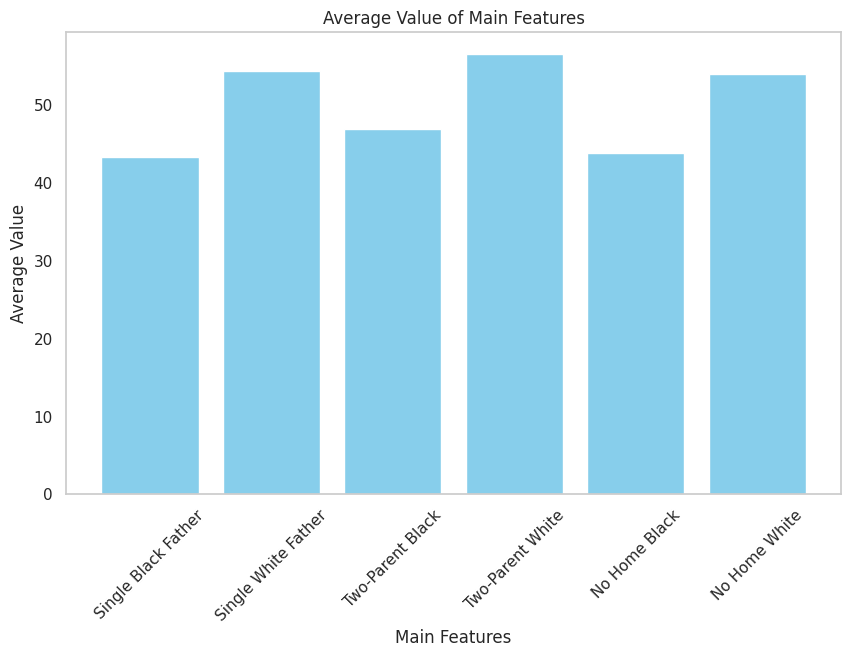

In [ ]:
columns = ['kir_1par_black_male', 'kir_1par_white_male', 'kir_2par_black_male',
           'kir_2par_white_male', 'kir_par_nohome_black_male', 'kir_par_nohome_white_male']

avg_values = df_1_clean[columns].mean().reset_index()
avg_values.columns = ['Feature', 'Average']

plt.figure(figsize=(10, 6))
plt.bar(avg_values['Feature'], avg_values['Average'], color='skyblue')

plt.xlabel('Main Features')
plt.ylabel('Average Value')
plt.title('Average Value of Main Features')

new_labels = ['Single Black Father', 'Single White Father', 'Two-Parent Black',
              'Two-Parent White', 'No Home Black', 'No Home White']

plt.xticks(range(len(new_labels)), new_labels, rotation=45)

plt.grid(False)
plt.show()

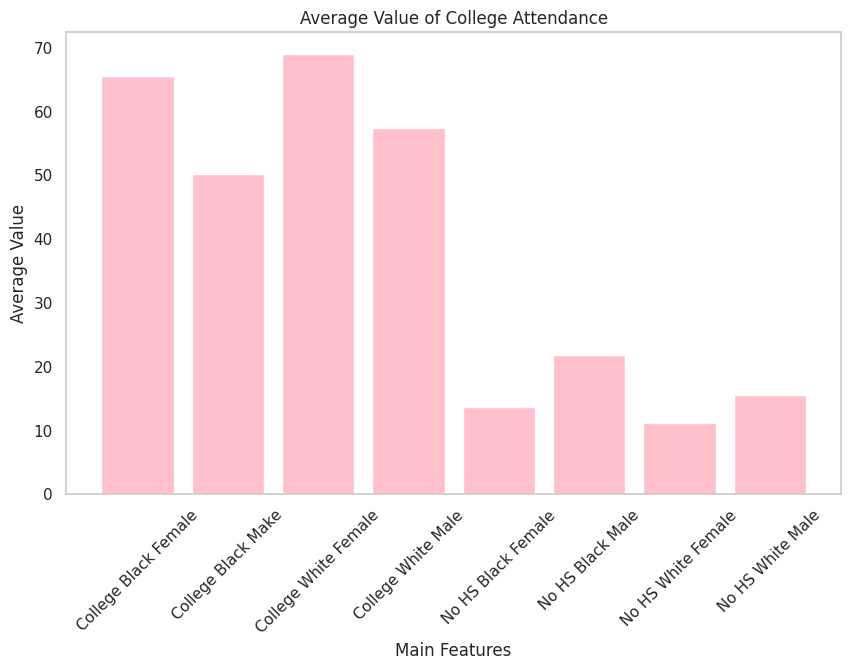

In [ ]:
columns = ['kid_college_black_female', 'kid_college_black_male', 'kid_college_white_female', 'kid_college_white_male', 'kid_no_hs_black_female', 'kid_no_hs_black_male', 'kid_no_hs_white_female', 'kid_no_hs_white_male']
avg_values = df_1_clean[columns].mean().reset_index()
avg_values.columns = ['Feature', 'Average']

plt.figure(figsize=(10, 6))
plt.bar(avg_values['Feature'], avg_values['Average'], color='pink')

plt.xlabel('Main Features')
plt.ylabel('Average Value')
plt.title('Average Value of College Attendance')

new_labels = ['College Black Female', 'College Black Make', 'College White Female','College White Male', 'No HS Black Female', 'No HS Black Male','No HS White Female','No HS White Male']

plt.xticks(range(len(new_labels)), new_labels, rotation=45)

plt.grid(False)
plt.show()

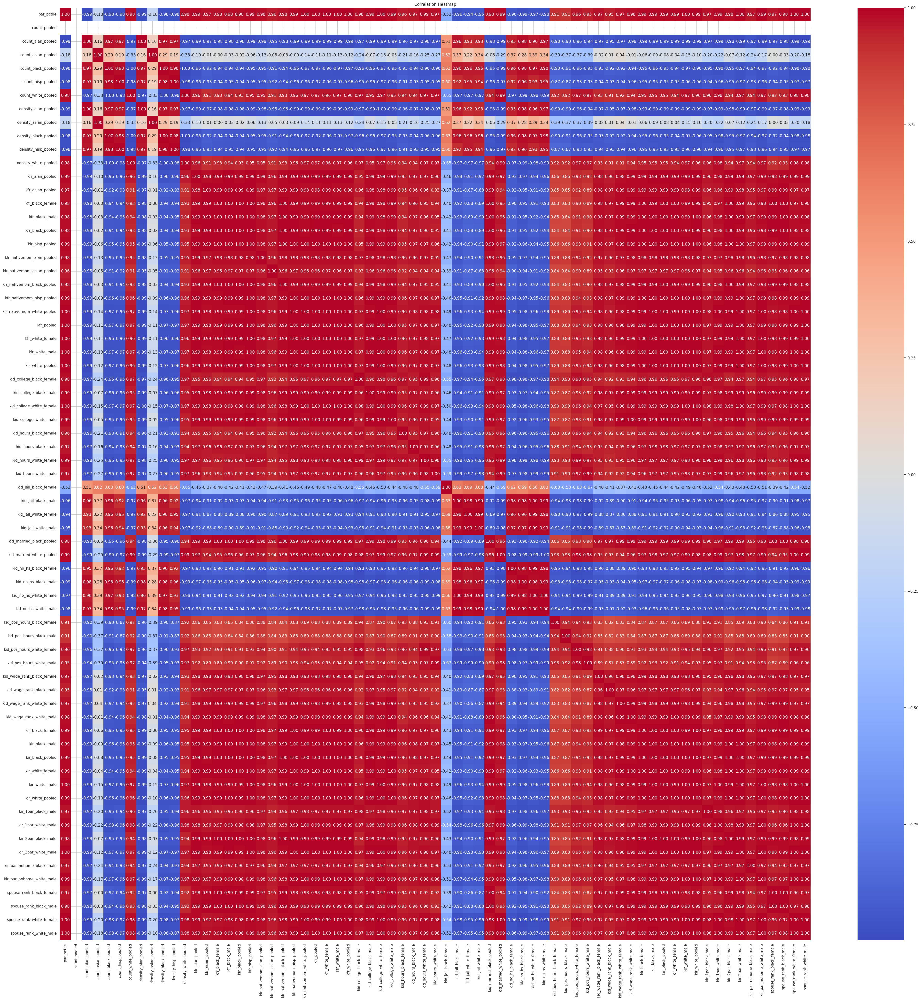

In [ ]:
corr_matrix = df_1_clean.corr()

# Step 2: Visualize the correlation matrix
plt.figure(figsize=(50, 50))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

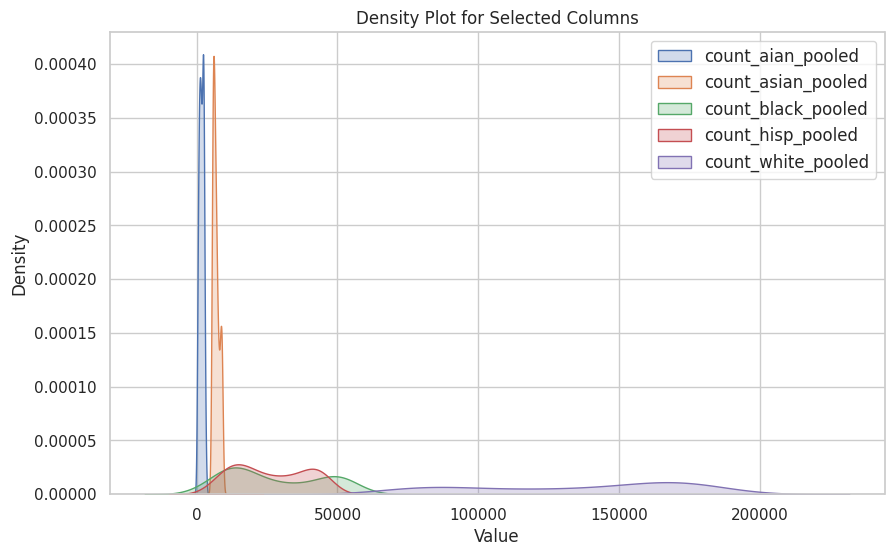

In [ ]:
columns_picked = ['count_aian_pooled', 'count_asian_pooled', 'count_black_pooled', 'count_hisp_pooled', 'count_white_pooled']

# Plot density plots for each column
plt.figure(figsize=(10, 6))

for i in columns_picked:
    sns.kdeplot(data=df_1_clean, x=i, label=columns_picked, fill=True)

plt.title('Density Plot for Selected Columns')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend(labels=['count_aian_pooled', 'count_asian_pooled', 'count_black_pooled', 'count_hisp_pooled', 'count_white_pooled'], fontsize = 12)

plt.show()

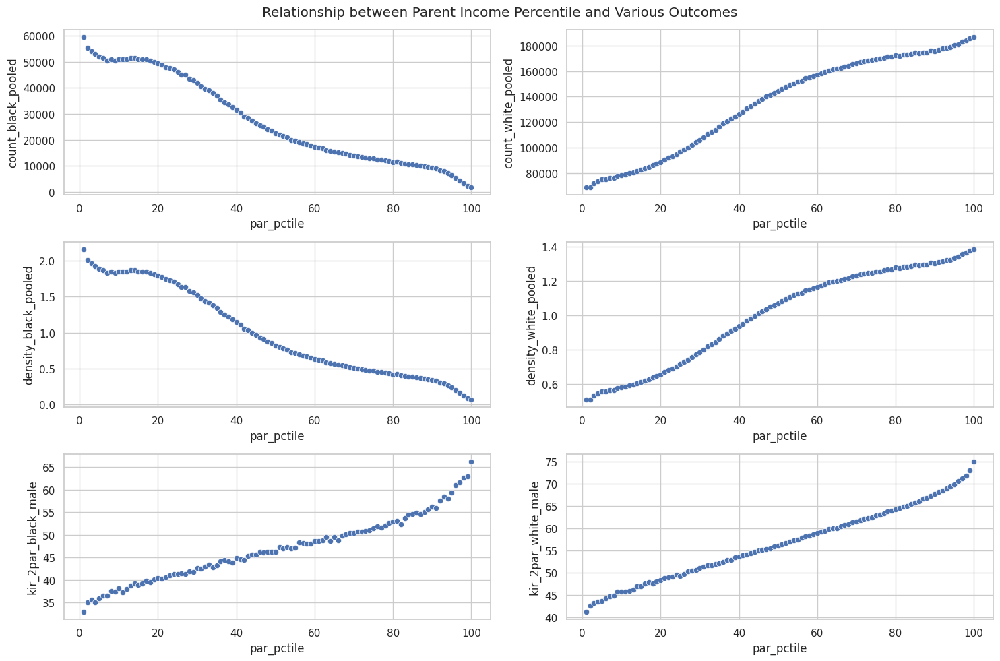

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(15, 10))
sns.scatterplot(x='par_pctile', y='count_black_pooled', data=df_1_clean, ax=axes[0, 0])
sns.scatterplot(x='par_pctile', y='count_white_pooled', data=df_1_clean, ax=axes[0, 1])
sns.scatterplot(x='par_pctile', y='density_black_pooled', data=df_1_clean, ax=axes[1, 0])
sns.scatterplot(x='par_pctile', y='density_white_pooled', data=df_1_clean, ax=axes[1, 1])
sns.scatterplot(x='par_pctile', y='kir_2par_black_male', data=df_1_clean, ax=axes[2, 0])
sns.scatterplot(x='par_pctile', y='kir_2par_white_male', data=df_1_clean, ax=axes[2, 1])
plt.suptitle("Relationship between Parent Income Percentile and Various Outcomes")
plt.tight_layout()
plt.show()

### Table 2

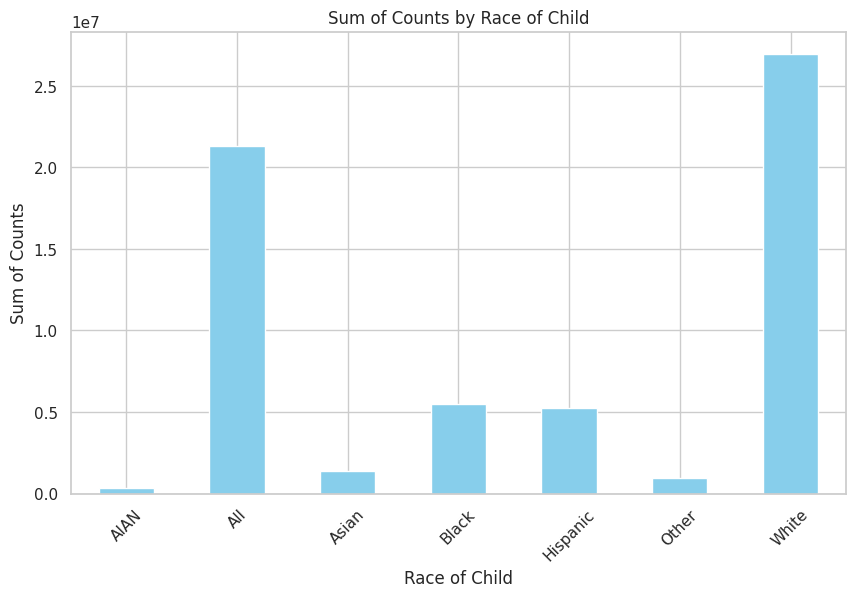

In [ ]:
race_counts = df_2_clean.groupby('kid_race')['count'].sum()

# Create a bar graph
plt.figure(figsize=(10, 6))
race_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Race of Child')
plt.ylabel('Sum of Counts')
plt.title('Sum of Counts by Race of Child')
plt.xticks(rotation=45)
plt.show()

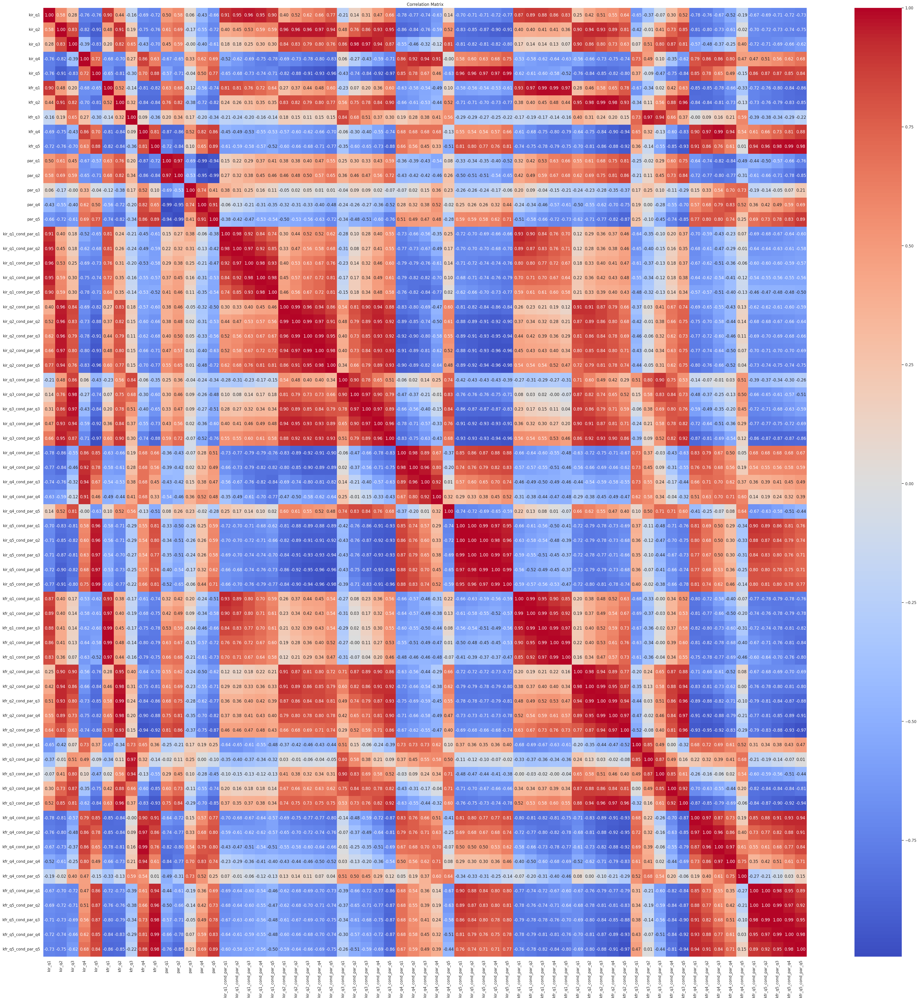

In [ ]:
# correlation matrix: table 2
plt.figure(figsize=(50, 50))
matrix_2 = df_2_clean.drop(['kid_race', 'count', 'gender'], axis=1)
correlaion_matrix=matrix_2.corr()
sns.heatmap(correlaion_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

### Table 3

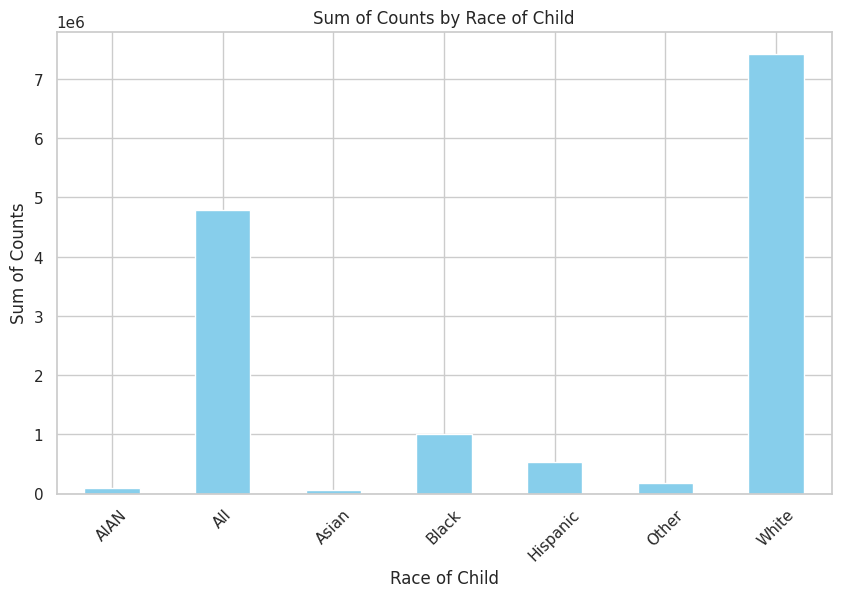

In [ ]:
race_counts = df_3_clean.groupby('kid_race')['count'].sum()

# Create a bar graph
plt.figure(figsize=(10, 6))
race_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Race of Child')
plt.ylabel('Sum of Counts')
plt.title('Sum of Counts by Race of Child')
plt.xticks(rotation=45)
plt.show()

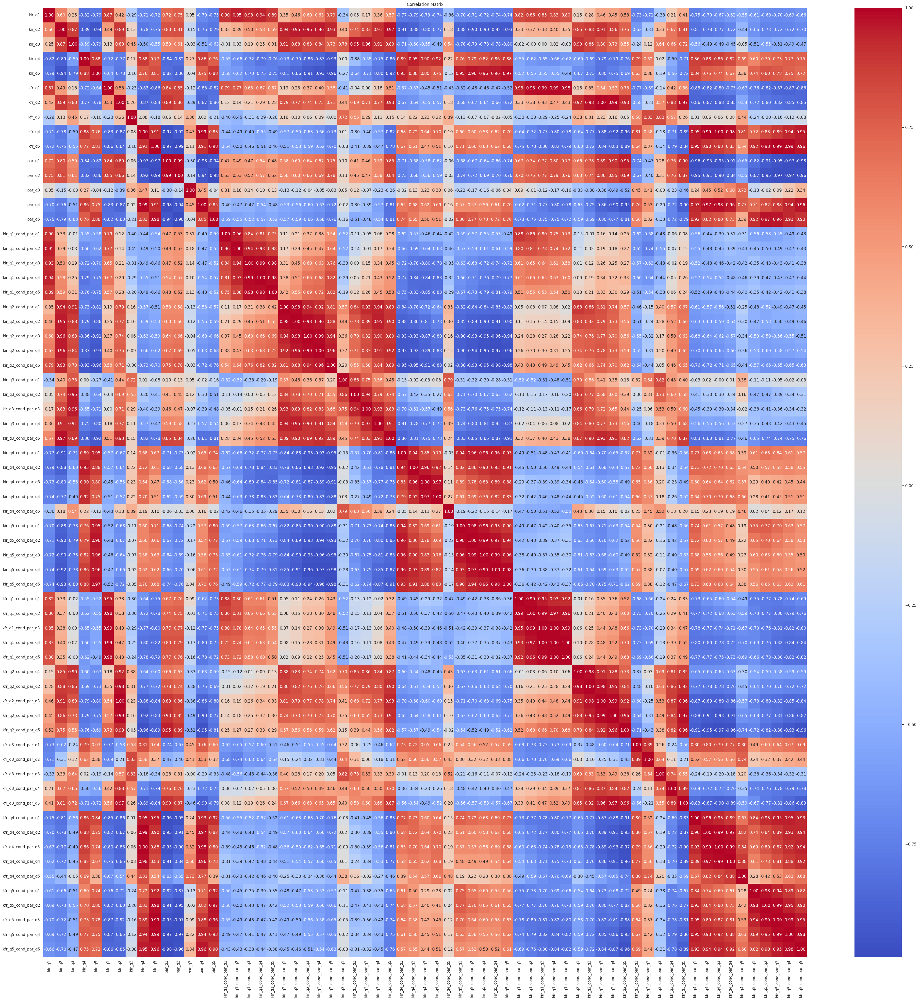

In [ ]:
# correlation matrix: table 3
plt.figure(figsize=(50, 50))
matrix_3 = df_3_clean.drop(['kid_race', 'count', 'gender'], axis=1)
correlaion_matrix=matrix_3.corr()
sns.heatmap(correlaion_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

### Table 4

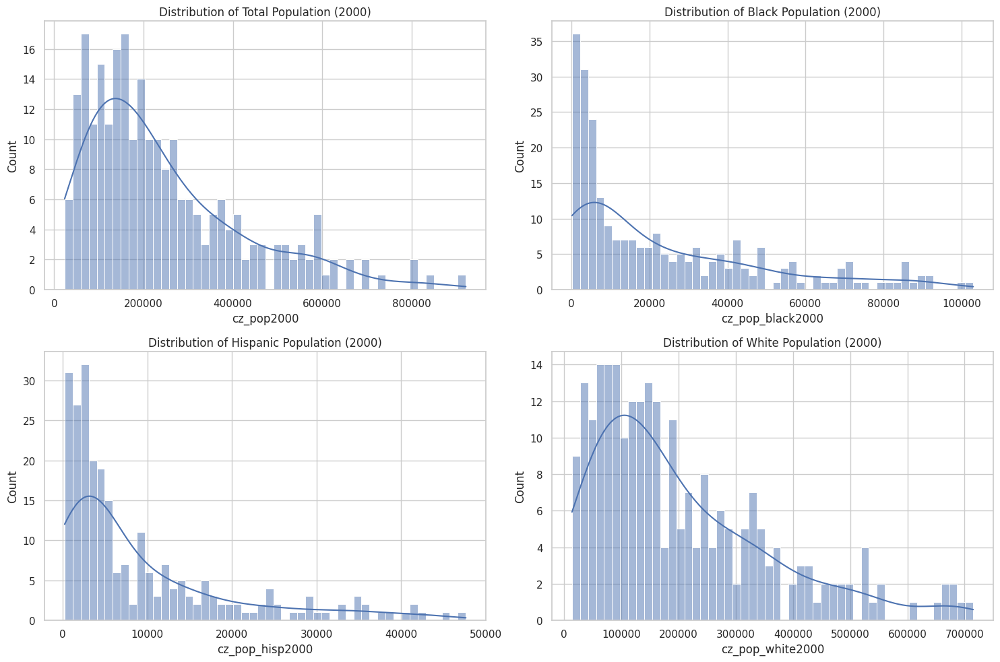

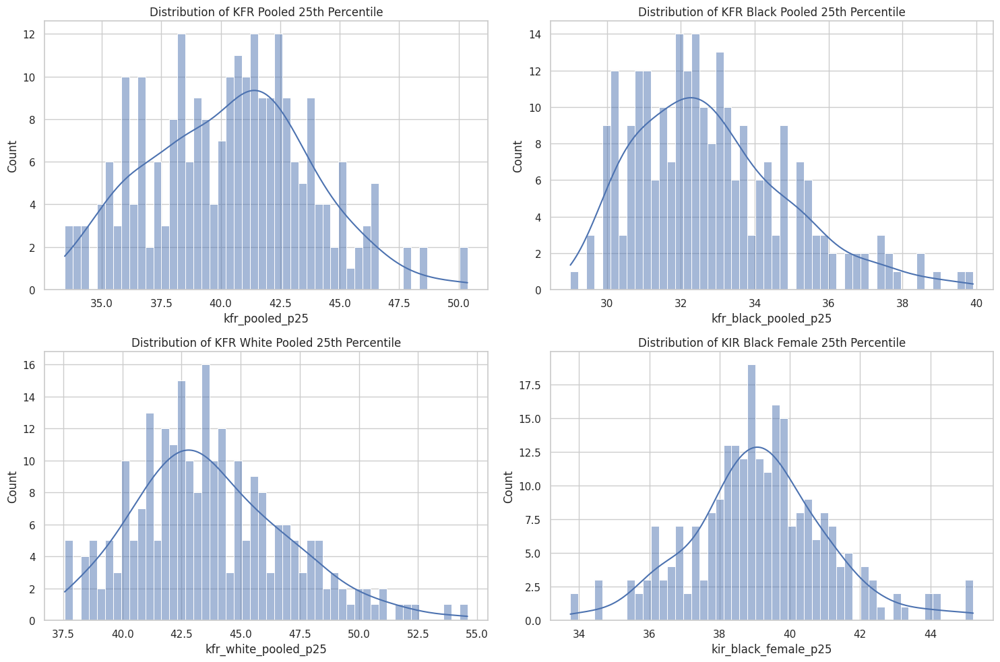

In [ ]:
sns.set(style="whitegrid")

# Create the subplots for the population distributions
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

sns.histplot(outliers_removed['cz_pop2000'], bins=50, kde=True, ax=axes[0, 0]).set_title('Distribution of Total Population (2000)')
sns.histplot(outliers_removed['cz_pop_black2000'], bins=50, kde=True, ax=axes[0, 1]).set_title('Distribution of Black Population (2000)')
sns.histplot(outliers_removed['cz_pop_hisp2000'], bins=50, kde=True, ax=axes[1, 0]).set_title('Distribution of Hispanic Population (2000)')
sns.histplot(outliers_removed['cz_pop_white2000'], bins=50, kde=True, ax=axes[1, 1]).set_title('Distribution of White Population (2000)')

plt.tight_layout()
plt.show()

# Create the subplots for the KFR and KIR distributions
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

sns.histplot(outliers_removed['kfr_pooled_p25'], bins=50, kde=True, ax=axes[0, 0]).set_title('Distribution of KFR Pooled 25th Percentile')
sns.histplot(outliers_removed['kfr_black_pooled_p25'], bins=50, kde=True, ax=axes[0, 1]).set_title('Distribution of KFR Black Pooled 25th Percentile')
sns.histplot(outliers_removed['kfr_white_pooled_p25'], bins=50, kde=True, ax=axes[1, 0]).set_title('Distribution of KFR White Pooled 25th Percentile')
sns.histplot(outliers_removed['kir_black_female_p25'], bins=50, kde=True, ax=axes[1, 1]).set_title('Distribution of KIR Black Female 25th Percentile')

plt.tight_layout()
plt.show()

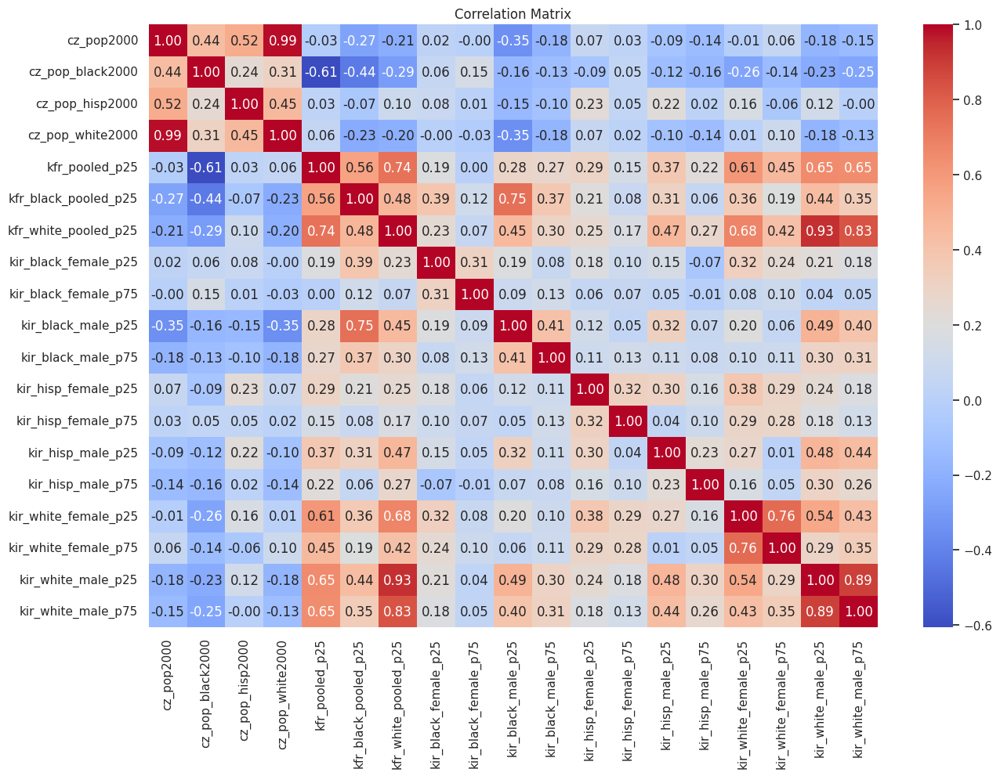

In [ ]:
# Plot the correlation matrix
plt.figure(figsize=(15, 10))
df4_correlation_matrix = outliers_removed.corr()
sns.heatmap(df4_correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

### Table 5

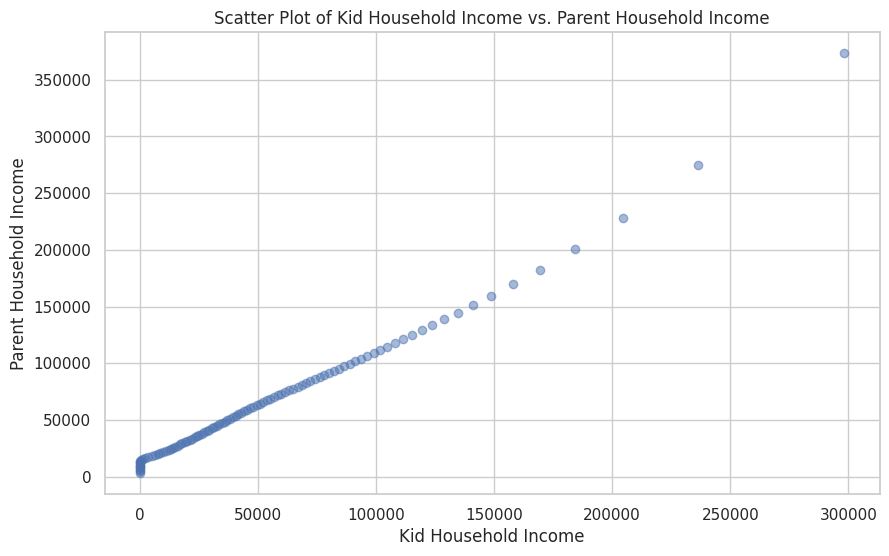

In [ ]:
#Scatter Plot of Kid HH Income vs. Parent HH Income (Outliers Included)
plt.figure(figsize=(10, 6))
plt.scatter(df_5['kid_hh_income'], df_5['parent_hh_income'], alpha=0.5)
plt.title('Scatter Plot of Kid Household Income vs. Parent Household Income')
plt.xlabel('Kid Household Income')
plt.ylabel('Parent Household Income')
plt.grid(True)
plt.show()

#Scatter Plot of Kid HH Income vs. Parent HH Income (Outliers Not Included)


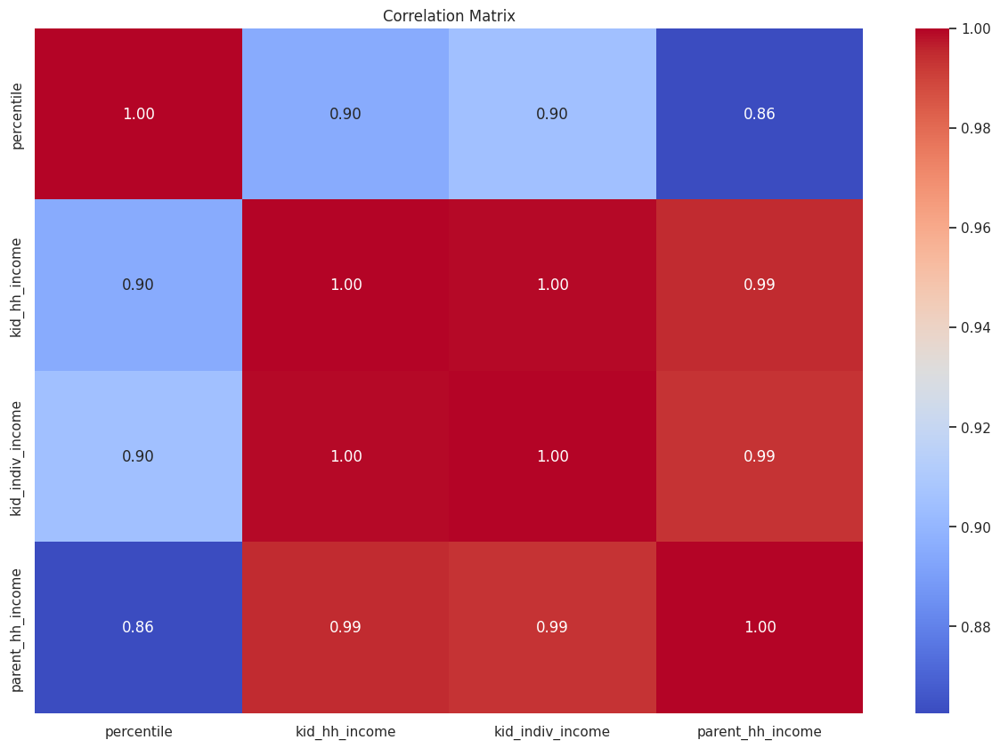

In [ ]:
plt.figure(figsize=(15, 10))
df5_correlation_matrix = df_5.corr()
sns.heatmap(df5_correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

### Table 6a & 6b

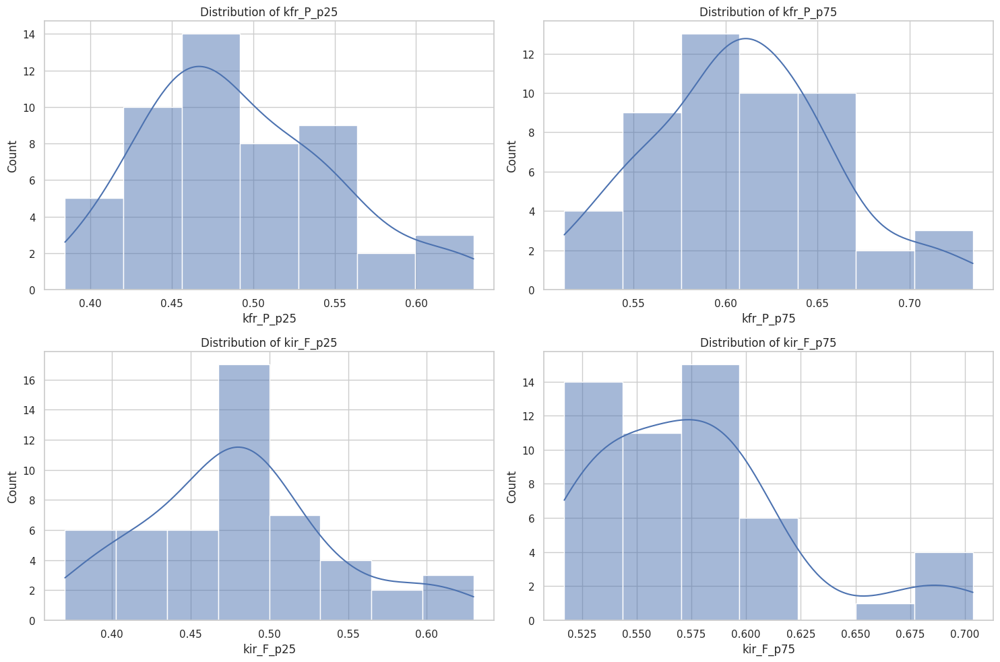

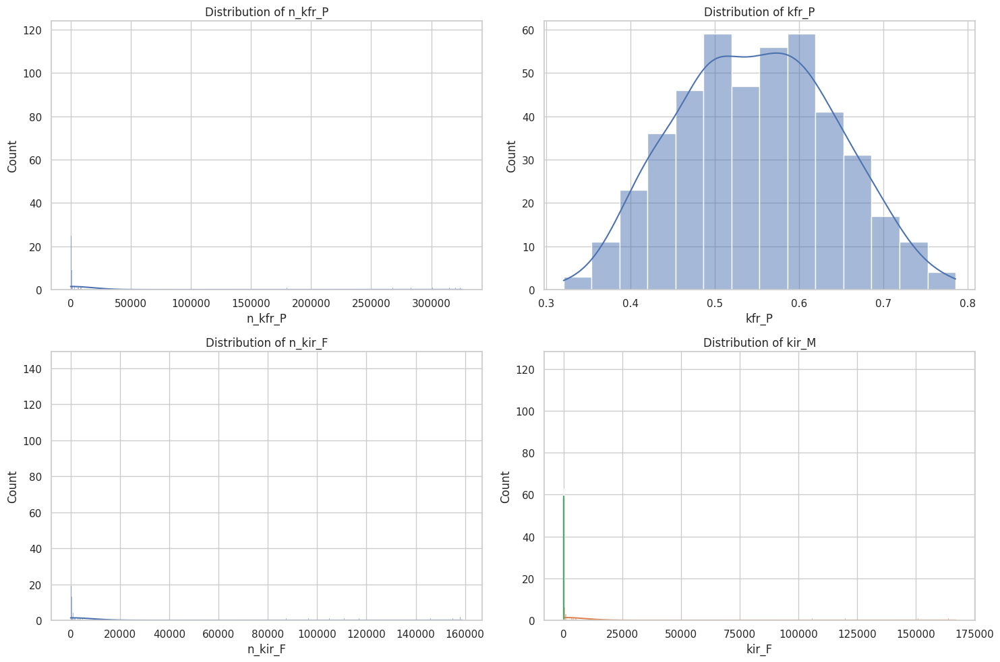

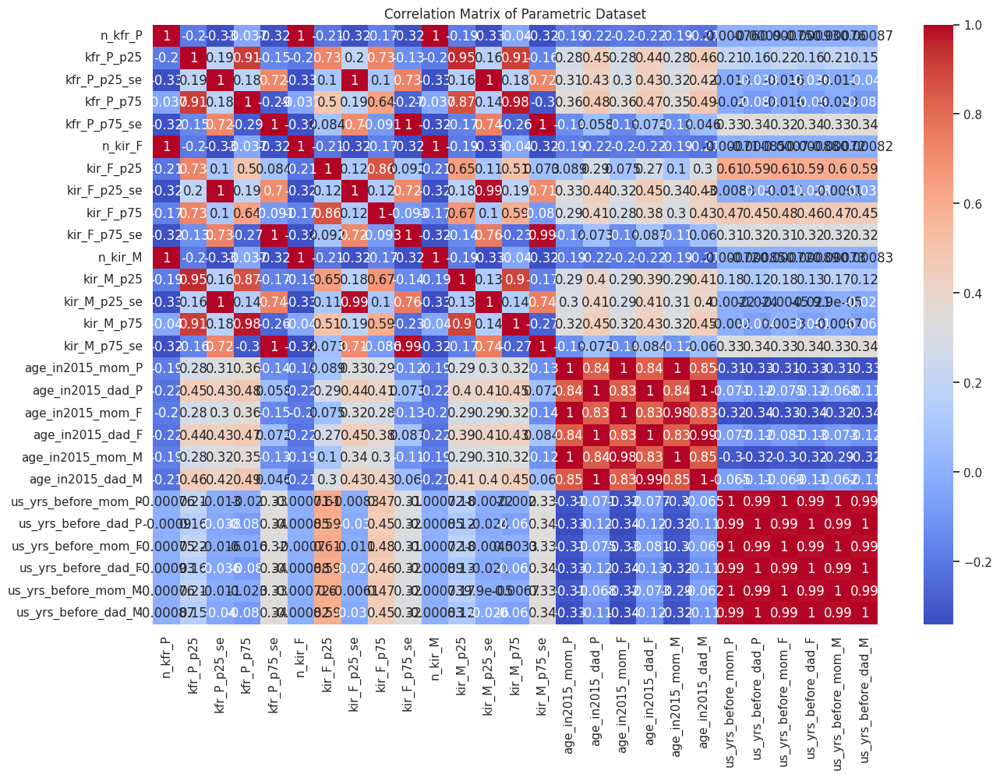

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure df_6a is the DataFrame you're working with
# Filter out non-numeric columns for safety (not strictly necessary if columns are correctly referenced)
df_numeric = df_6a.select_dtypes(include=[np.number])

# Plot distributions of key numeric variables
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

sns.histplot(df_numeric['kfr_P_p25'], ax=axes[0, 0], kde=True).set_title('Distribution of kfr_P_p25')
sns.histplot(df_numeric['kfr_P_p75'], ax=axes[0, 1], kde=True).set_title('Distribution of kfr_P_p75')
sns.histplot(df_numeric['kir_F_p25'], ax=axes[1, 0], kde=True).set_title('Distribution of kir_F_p25')
sns.histplot(df_numeric['kir_F_p75'], ax=axes[1, 1], kde=True).set_title('Distribution of kir_F_p75')

plt.tight_layout()
plt.show()

# Ensure df_6b is the DataFrame you're working with
# Filter out non-numeric columns for safety (not strictly necessary if columns are correctly referenced)
df_numeric2 = df_6b.select_dtypes(include=[np.number])

# Plot distributions of key numeric variables
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

sns.histplot(df_numeric2['n_kfr_P'], ax=axes[0, 0], kde=True).set_title('Distribution of n_kfr_P')
sns.histplot(df_numeric2['kfr_P'], ax=axes[0, 1], kde=True).set_title('Distribution of kfr_P')
sns.histplot(df_numeric2['n_kir_F'], ax=axes[1, 0], kde=True).set_title('Distribution of n_kir_F')
sns.histplot(df_numeric2['kir_F'], ax=axes[1, 1], kde=True).set_title('Distribution of kir_F')
sns.histplot(df_numeric2['n_kir_M'], ax=axes[1, 1], kde=True).set_title('Distribution of n_kir_M')
sns.histplot(df_numeric2['kir_M'], ax=axes[1, 1], kde=True).set_title('Distribution of kir_M')

plt.tight_layout()
plt.show()

# Correlation matrix of only numeric columns
corr_matrix = df_numeric.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Parametric Dataset')
plt.show()


The kfr_P_p25 and kfr_P_p75 (parents' income rank in the commuting zone for children) show strong correlations with kir_F_p25, kir_F_p75, kir_M_p25, kir_M_p75, etc. This implies a significant relationship between the economic status of parents and their children, aligning with the intergenerational transmission of economic status.

### Table 7

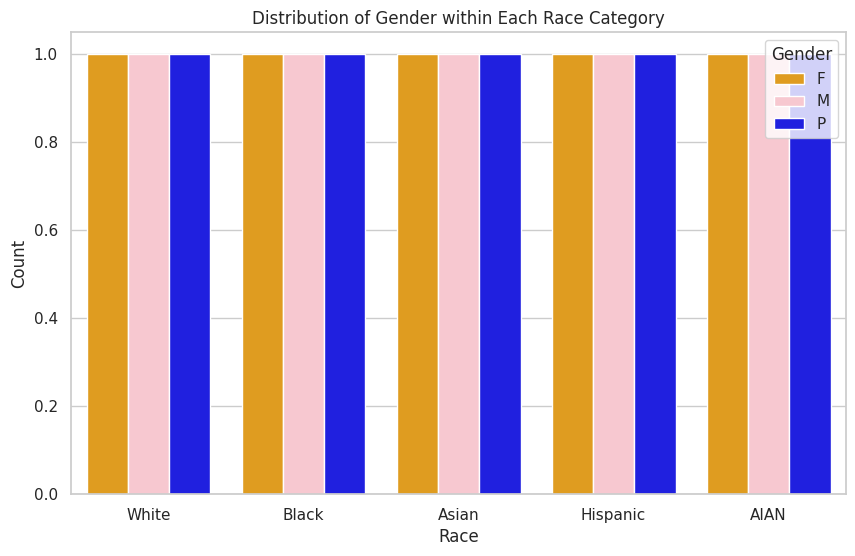

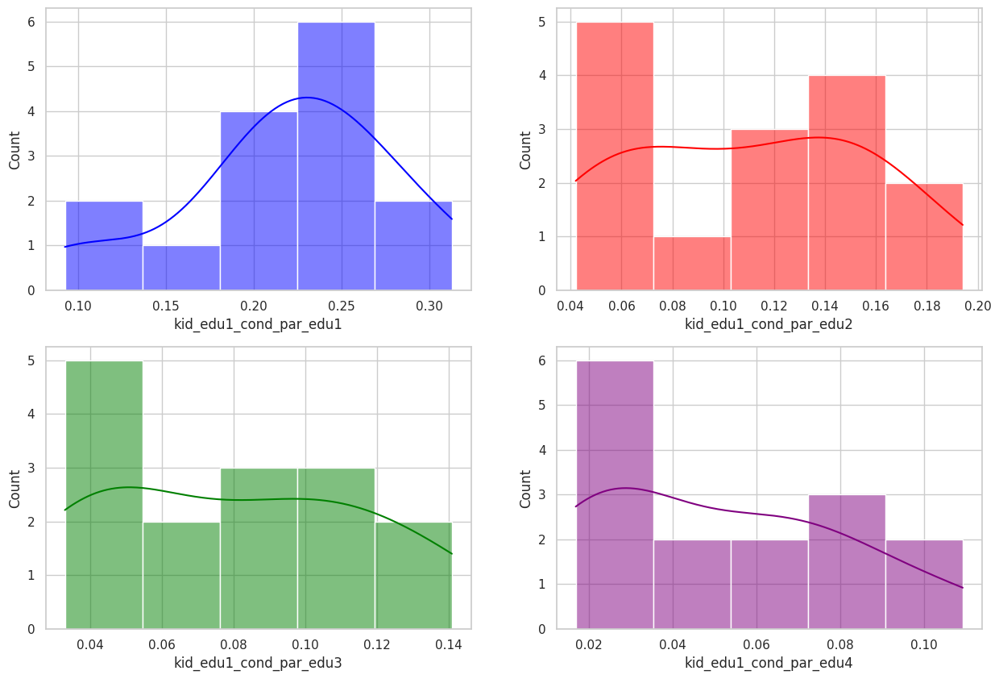

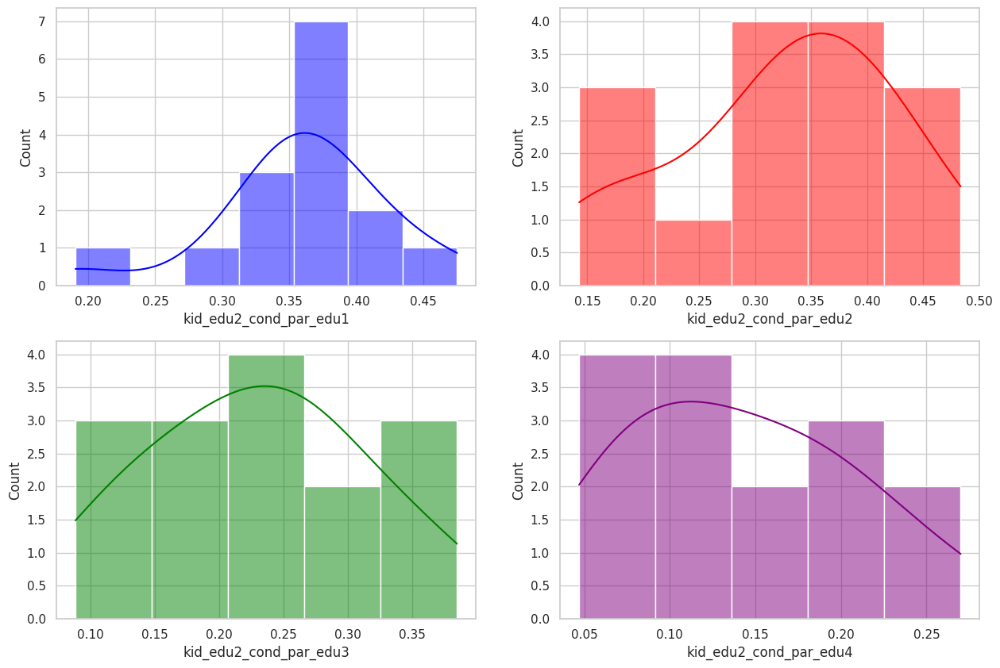

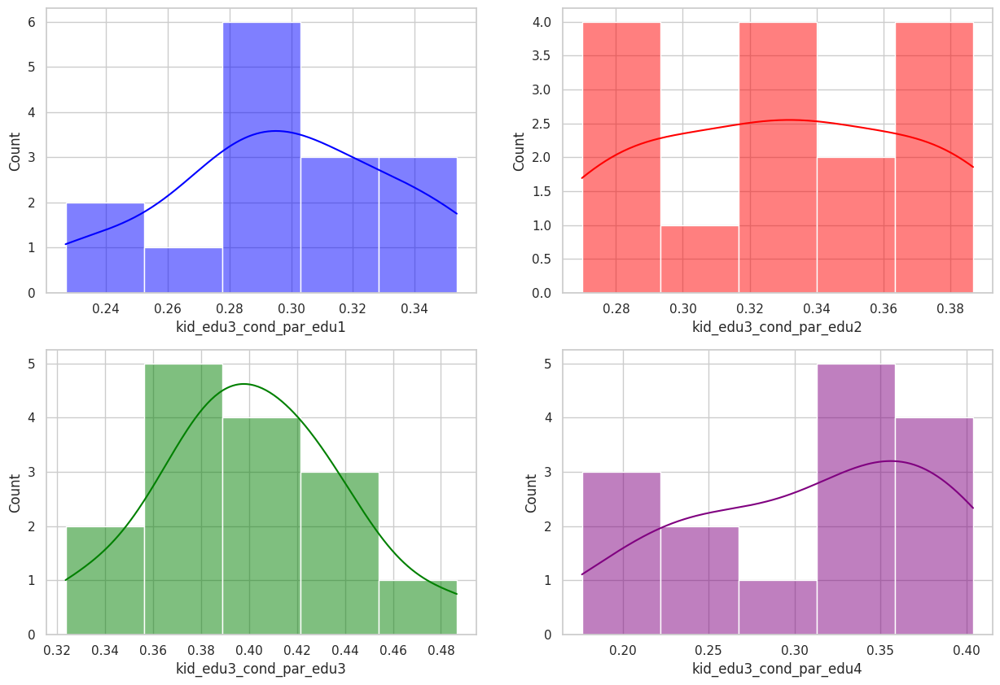

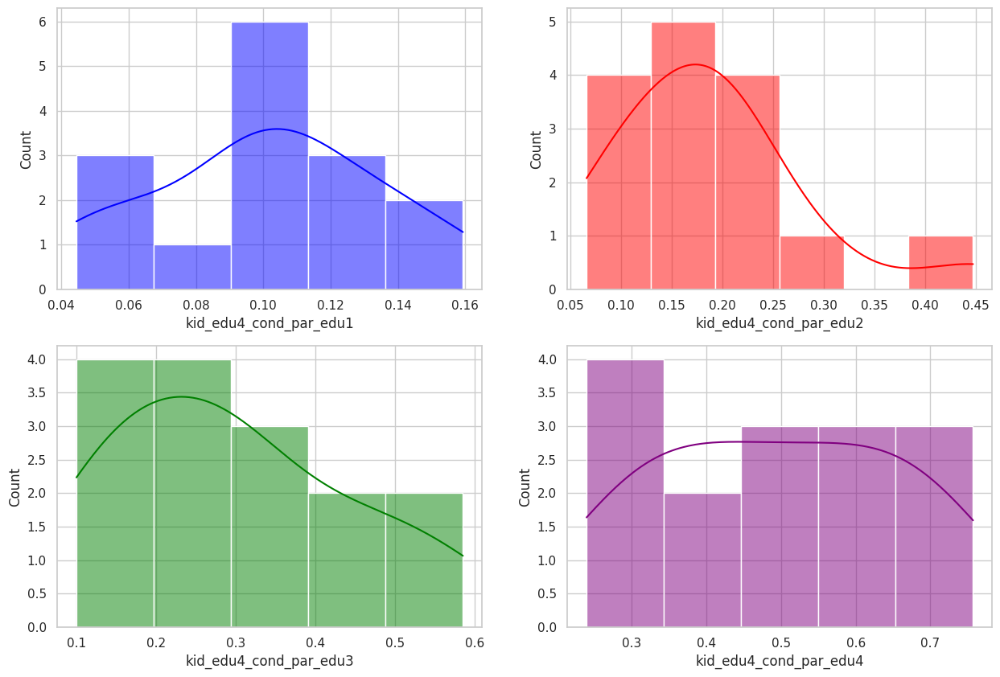

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(x='kid_race', hue='gender', data=df_7_clean, palette=['orange', 'pink','blue'])
plt.title('Distribution of Gender within Each Race Category')
plt.xlabel('Race')
plt.ylabel('Count')
plt.legend(title='Gender')
plt.show()

fig,axes=plt.subplots(nrows=2,ncols=2,figsize=(15,10))
sns.histplot(df_7_clean['kid_edu1_cond_par_edu1'],ax=axes[0, 0],kde=True, color='blue')
sns.histplot(df_7_clean['kid_edu1_cond_par_edu2'],ax=axes[0, 1],kde=True, color='red')
sns.histplot(df_7_clean['kid_edu1_cond_par_edu3'],ax=axes[1, 0], kde=True, color='green')
sns.histplot(df_7_clean['kid_edu1_cond_par_edu4'],ax=axes[1, 1],kde=True, color='purple')
plt.show()

fig,axes=plt.subplots(nrows=2,ncols=2,figsize=(15,10))
sns.histplot(df_7_clean['kid_edu2_cond_par_edu1'],ax=axes[0, 0],kde=True, color='blue')
sns.histplot(df_7_clean['kid_edu2_cond_par_edu2'],ax=axes[0, 1],kde=True, color='red')
sns.histplot(df_7_clean['kid_edu2_cond_par_edu3'],ax=axes[1, 0], kde=True, color='green')
sns.histplot(df_7_clean['kid_edu2_cond_par_edu4'],ax=axes[1, 1],kde=True, color='purple')
plt.show()

fig,axes=plt.subplots(nrows=2,ncols=2,figsize=(15,10))
sns.histplot(df_7_clean['kid_edu3_cond_par_edu1'],ax=axes[0, 0],kde=True, color='blue')
sns.histplot(df_7_clean['kid_edu3_cond_par_edu2'],ax=axes[0, 1],kde=True, color='red')
sns.histplot(df_7_clean['kid_edu3_cond_par_edu3'],ax=axes[1, 0], kde=True, color='green')
sns.histplot(df_7_clean['kid_edu3_cond_par_edu4'],ax=axes[1, 1],kde=True, color='purple')
plt.show()

fig,axes=plt.subplots(nrows=2,ncols=2,figsize=(15,10))
sns.histplot(df_7_clean['kid_edu4_cond_par_edu1'],ax=axes[0, 0],kde=True, color='blue')
sns.histplot(df_7_clean['kid_edu4_cond_par_edu2'],ax=axes[0, 1],kde=True, color='red')
sns.histplot(df_7_clean['kid_edu4_cond_par_edu3'],ax=axes[1, 0], kde=True, color='green')
sns.histplot(df_7_clean['kid_edu4_cond_par_edu4'],ax=axes[1, 1],kde=True, color='purple')
plt.show()


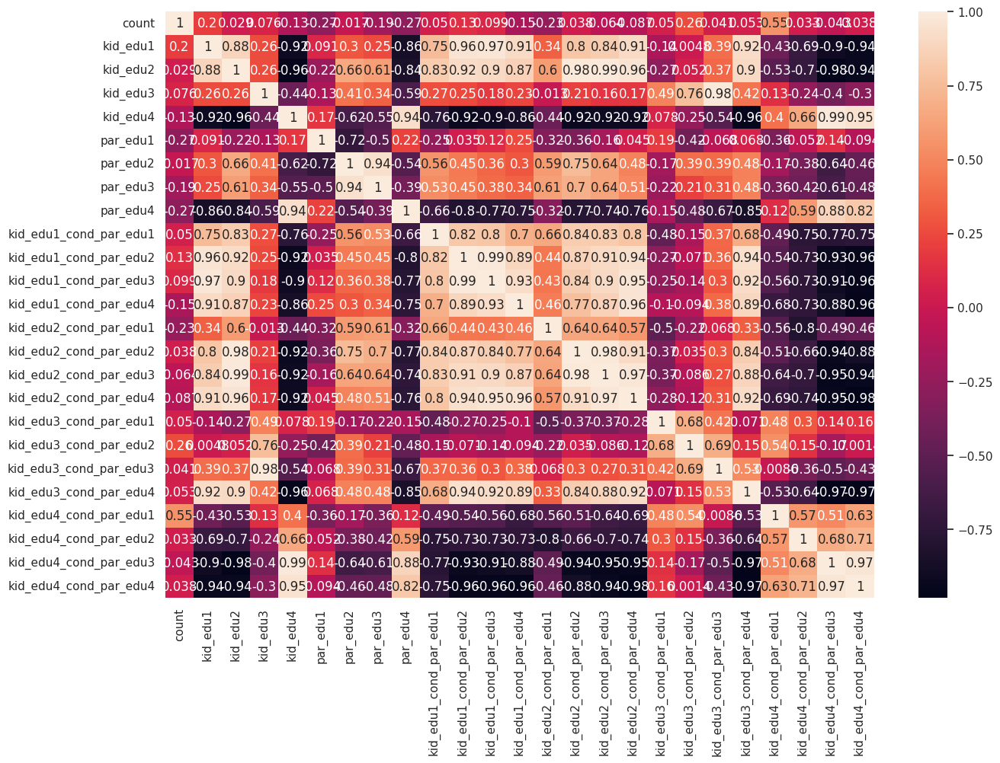

In [ ]:
# First two columns are string so that I dropped first two columns to create the correlaion_matrix
df_7_clean_new=df_7_clean.copy()
df_7_num=df_7_clean_new.drop(columns=["kid_race","gender"])
df_7_num

plt.figure(figsize=(15,10))
correlaion_matrix=df_7_num.corr()
sns.heatmap(correlaion_matrix,annot=True)
plt.show()

## Modeling

This section is where the rubber meets the road. As a reminder: your group should work on **two** prediction questions in the project. Questions should be related, but have distinct work efforts, interpretation and analysis.

In this section you must:
1. Explore at least two models for **each** prediction or inference question, ranging from the simple (e.g. simple linear regression like OLS) to the complex (e.g. Lasso, Ridge, or [more](https://scikit-learn.org/stable/index.html)). You may also work on classification and/or clustering as one of your model. It may be beneficial to compare a supervised model (e.g. regression, classification) to an unsupervised model (e.g. clustering).  
2. Motivate all your modeling decisions.  This includes **feature choices** (e.g. why do you include these variables in the regression), **parameter choices** (e.g. how many folds in [k-fold cross validation](https://machinelearningmastery.com/k-fold-cross-validation/), what time window you use for averaging your data, how many clusters in clustering) as well as **model form** (e.g., If you use LASSO, why?  If you include nonlinear features in a regression model, why?).
3. Carefully describe your [model selection](https://en.wikipedia.org/wiki/Model_selection) process (including [cross validation](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_validate.html) if any). If you are working on forecasting and prediction models (e.g. classification, time series models), you should partition your data into [training and testing sets](https://en.wikipedia.org/wiki/Training,_validation,_and_test_data_sets). The training data set is what you use for cross-validation (i.e. you sample from within it to create folds, etc.).  The testing data set is held to the very end of your efforts, and used to compare different models. This is also a great place to visualize how you've used the bias-variance tradeoff plot in your decision behind the complexity of your models.
4. Be very carefully documenting your workflow. Make sure to explain each basic step in your analysis. Include comments!   
5. Seek opportunities to write functions that allow you to avoid doing things over and over, and that make your code more succinct and readable. This is especially helpful when you're deploying a multitude of models.

### Feature Importance

In [ ]:
df_1 = pd.read_csv('table_1.csv') # National Statistics by Parent Income Percentile, Gender, and Race

# Drop duplicates
df_1 = df_1.drop_duplicates()

# Print the column names to help identify the correct target column
print(df_1.columns)

# Fill NaN values with the mean for the selected columns
na_cols = ["kid_college_black_female", "kid_jail_black_female", "kid_no_hs_black_female", "kid_pos_hours_black_female", "kid_pos_hours_black_male"]
df_1[na_cols] = df_1[na_cols].fillna(df_1[na_cols].mean())

# Function to remove outliers using IQR
def remove_outliers(df):
    for column in df.columns:
        if df[column].dtype in ['int64', 'float64']:
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            df[column] = np.where((df[column] < lower_bound) | (df[column] > upper_bound), np.nan, df[column])
    return df

# Apply the function to remove outliers
df_1_clean = remove_outliers(df_1)

# Impute remaining NaN values with the mean
imputer = SimpleImputer(strategy='mean')
df_1_clean = pd.DataFrame(imputer.fit_transform(df_1_clean), columns=df_1_clean.columns)

# Set the correct target column name and binarize it
target = 'kir_black_male'  # Adjust this based on the actual column name from the printed column names
df_1_clean[target] = (df_1_clean[target] > df_1_clean[target].mean()).astype(int)

features = df_1_clean.drop(columns=[target])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, df_1_clean[target], test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Calculate feature importance
feature_importances = clf.feature_importances_
feature_names = features.columns

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print(importance_df.head(10))

Index(['par_pctile', 'count_pooled', 'count_aian_pooled', 'count_asian_pooled',
       'count_black_pooled', 'count_hisp_pooled', 'count_white_pooled',
       'density_aian_pooled', 'density_asian_pooled', 'density_black_pooled',
       'density_hisp_pooled', 'density_white_pooled', 'kfr_aian_pooled',
       'kfr_asian_pooled', 'kfr_black_female', 'kfr_black_male',
       'kfr_black_pooled', 'kfr_hisp_pooled', 'kfr_nativemom_aian_pooled',
       'kfr_nativemom_asian_pooled', 'kfr_nativemom_black_pooled',
       'kfr_nativemom_hisp_pooled', 'kfr_nativemom_white_pooled', 'kfr_pooled',
       'kfr_white_female', 'kfr_white_male', 'kfr_white_pooled',
       'kid_college_black_female', 'kid_college_black_male',
       'kid_college_white_female', 'kid_college_white_male',
       'kid_hours_black_female', 'kid_hours_black_male',
       'kid_hours_white_female', 'kid_hours_white_male',
       'kid_jail_black_female', 'kid_jail_black_male', 'kid_jail_white_female',
       'kid_jail_white_male',

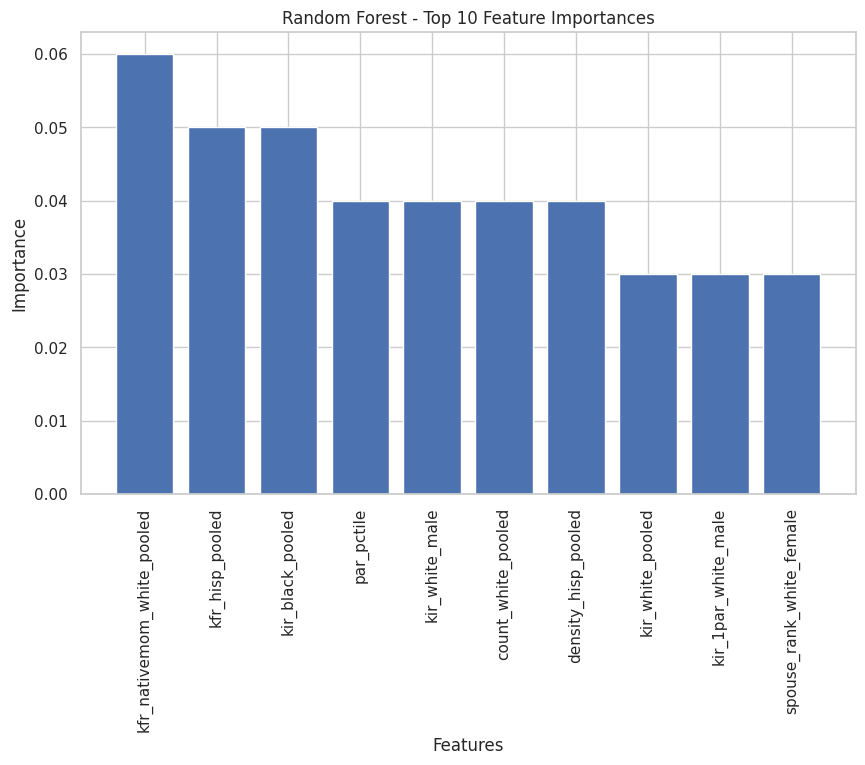

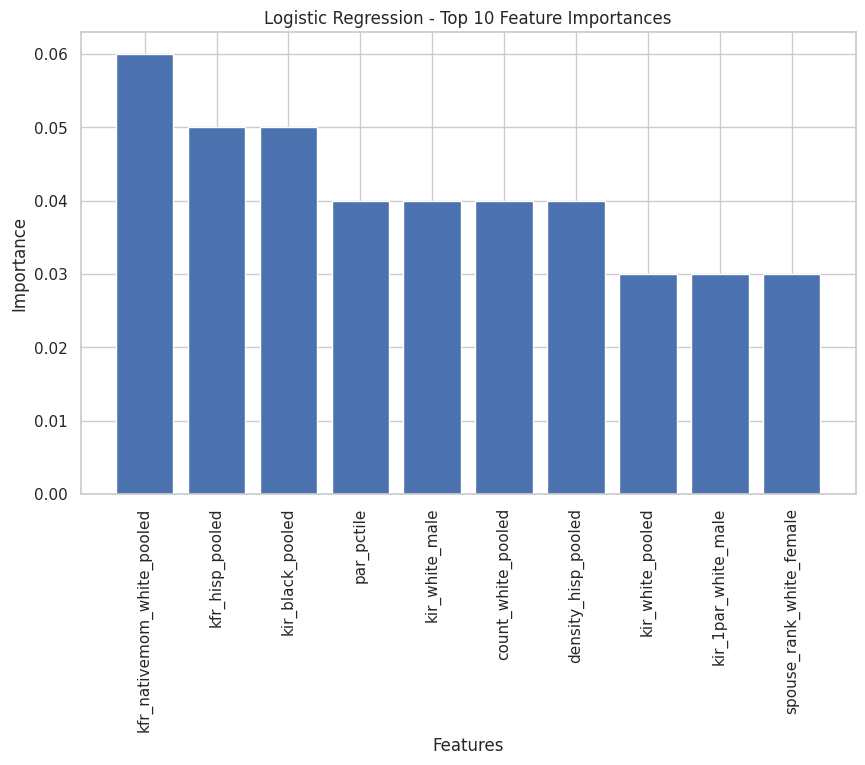

In [ ]:
top_10_rf = importance_df.head(10)
plt.figure(figsize=(10, 6))
plt.title("Random Forest - Top 10 Feature Importances")
plt.bar(range(len(top_10_rf)), top_10_rf['Importance'], align='center')
plt.xticks(range(len(top_10_rf)), top_10_rf['Feature'], rotation='vertical')
plt.xlabel("Features")
plt.ylabel("Importance")
plt.show()

# Visualization of top 10 feature importances for Logistic Regression
top_10_logreg = importance_df.head(10)
plt.figure(figsize=(10, 6))
plt.title("Logistic Regression - Top 10 Feature Importances")
plt.bar(range(len(top_10_logreg)), top_10_logreg['Importance'], align='center')
plt.xticks(range(len(top_10_logreg)), top_10_logreg['Feature'], rotation='vertical')
plt.xlabel("Features")
plt.ylabel("Importance")
plt.show()

### Baseline Models (OLS Regression)

In [ ]:
import pandas as pd
import statsmodels.api as sm

# Filter data for low-income (percentile <= 25)
data = df_1[df_1['par_pctile'] <= 25]

# Define a function to perform OLS regression and return results
def ols_regression(df, y_col, x_cols):
    X = df[x_cols]
    y = df[y_col]
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    return model

# Example dependent variable
dependent_variable = 'kir_black_male'

# List of independent variables for each regression
independent_variables_list = [
    ['kir_1par_black_male'],  # Low-Income Black Father Presence
    ['kir_1par_black_male', 'kir_1par_white_male'],  # Low-Income Black Father Presence, Low-Income White Father Presence/All Traits
    ['kir_1par_black_male', 'kir_2par_black_male'],  # Low-Income Black Father Presence, Low-Income Black Fathers Absent/Black Fathers per Child
    ['kir_1par_black_male', 'kir_2par_white_male'],  # Low-Income Black Father Presence, Low-Income Children Two Parents/Gender Ratio
]

# Perform regressions and compile results
results = []
for i, x_cols in enumerate(independent_variables_list):
    model = ols_regression(data, dependent_variable, x_cols)
    results.append(model)

# Print results in formatted table
for i, model in enumerate(results):
    print(f"Results for regression {i+1}:")
    print(model.summary())
    print("\n")


Results for regression 1:
                            OLS Regression Results                            
Dep. Variable:         kir_black_male   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 3.864e+04
Date:                Sun, 27 Jul 2025   Prob (F-statistic):           1.33e-38
Time:                        23:49:38   Log-Likelihood:                 33.564
No. Observations:                  25   AIC:                            -63.13
Df Residuals:                      23   BIC:                            -60.69
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const   

### Alternative Model Analysis

#### Regression Model 1
How does Low-Income Black Father Presence impact on mean child individual income rank for black males?

In [ ]:
#PREDICTION MODEL 1:

# split the data into features and target variable
X_1 = data[['kir_1par_black_male']]
y_1 = data['kir_black_male']

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_1, y_1, test_size=0.2, random_state=42)
# 20% of  test size
# 80% of train size
# use 80% of the train to Training Set: This is used to train or fit the model. It includes both the input data (features) and the expected output (target). The model learns to map the input to the output using this set.
#Testing Set: This is used to evaluate the model’s performance. It also includes both the input data and the expected output, but this data is not used during the training phase. The idea is to test how well the model can generalize to new, unseen data.


# define the models
lr = LinearRegression()
lasso = Lasso(alpha=0.1)
ridge = Ridge(alpha=0.1)
en = ElasticNet(alpha=0.1)
dt = DecisionTreeRegressor(random_state=42)
rf = RandomForestRegressor(random_state=42)
xgb = XGBRegressor(random_state=42)
svr = SVR()

# fit the models
lr.fit(X_train, y_train)
lasso.fit(X_train, y_train)
ridge.fit(X_train, y_train)
en.fit(X_train, y_train)
dt.fit(X_train, y_train)
rf.fit(X_train, y_train)
xgb.fit(X_train, y_train)
svr.fit(X_train, y_train)

# predict the target variable for test set using the models
lr_pred = lr.predict(X_test)
lasso_pred = lasso.predict(X_test)
ridge_pred = ridge.predict(X_test)
en_pred = en.predict(X_test)
dt_pred = dt.predict(X_test)
rf_pred = rf.predict(X_test)
xgb_pred = xgb.predict(X_test)
svr_pred = svr.predict(X_test)

# calculate r-squared and mean squared error for the models
lr_r2_1 = r2_score(y_test, lr_pred)
lr_mse_1 = mean_squared_error(y_test, lr_pred)

lasso_r2_1 = r2_score(y_test, lasso_pred)
lasso_mse_1 = mean_squared_error(y_test, lasso_pred)

ridge_r2_1 = r2_score(y_test, ridge_pred)
ridge_mse_1 = mean_squared_error(y_test, ridge_pred)

en_r2_1 = r2_score(y_test, en_pred)
en_mse_1 = mean_squared_error(y_test, en_pred)

dt_r2_1 = r2_score(y_test, dt_pred)
dt_mse_1 = mean_squared_error(y_test, dt_pred)

rf_r2_1 = r2_score(y_test, rf_pred)
rf_mse_1 = mean_squared_error(y_test, rf_pred)

xgb_r2_1 = r2_score(y_test, xgb_pred)
xgb_mse_1 = mean_squared_error(y_test, xgb_pred)

svr_r2_1 = r2_score(y_test, svr_pred)
svr_mse_1 = mean_squared_error(y_test, svr_pred)

# print the r-squared and mean squared error for the models
print("Linear Regression R-squared: {:.3f}, MSE: {:.3f}".format(lr_r2_1, lr_mse_1))
print("Lasso Regression R-squared: {:.3f}, MSE: {:.3f}".format(lasso_r2_1, lasso_mse_1))
print("Ridge Regression R-squared: {:.3f}, MSE: {:.3f}".format(ridge_r2_1, ridge_mse_1))
print("ElasticNet R-squared: {:.3f}, MSE: {:.3f}".format(en_r2_1, en_mse_1))
print("Decision Trees Regression R-squared: {:.3f}, MSE: {:.3f}".format(dt_r2_1, dt_mse_1))
print("Random Forest Regression R-squared: {:.3f}, MSE: {:.3f}".format(rf_r2_1, rf_mse_1))
print("XGBoost Regression R-squared: {:.3f}, MSE: {:.3f}".format(xgb_r2_1, xgb_mse_1))
print("SVM Regression R-squared: {:.3f}, MSE: {:.3f}".format(svr_r2_1, svr_mse_1))



Linear Regression R-squared: 0.999, MSE: 0.011
Lasso Regression R-squared: 0.998, MSE: 0.021
Ridge Regression R-squared: 0.999, MSE: 0.011
ElasticNet R-squared: 0.998, MSE: 0.021
Decision Trees Regression R-squared: 0.966, MSE: 0.332
Random Forest Regression R-squared: 0.939, MSE: 0.598
XGBoost Regression R-squared: 0.957, MSE: 0.426
SVM Regression R-squared: 0.644, MSE: 3.510


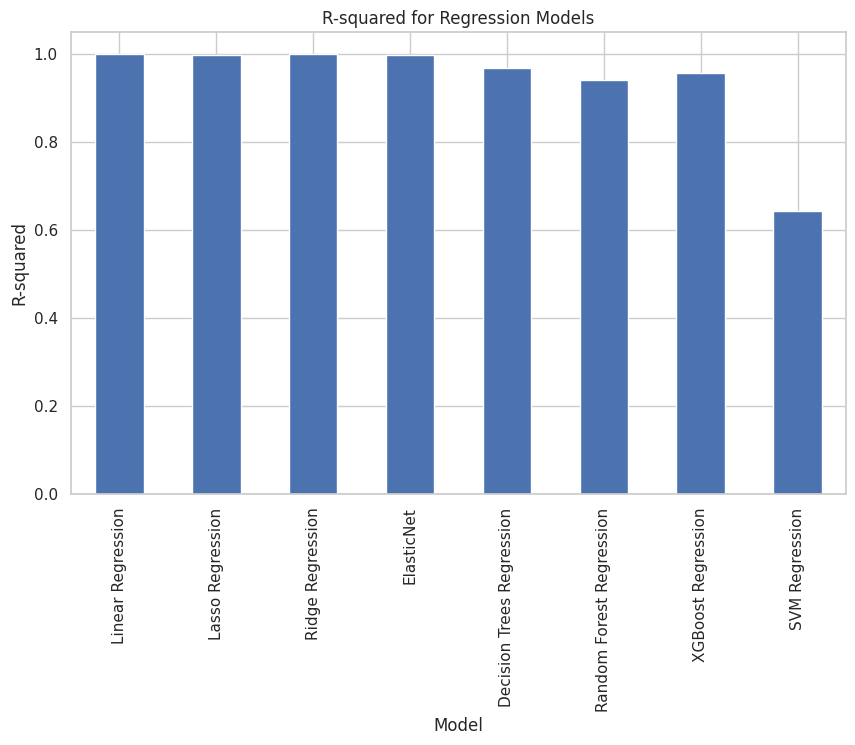

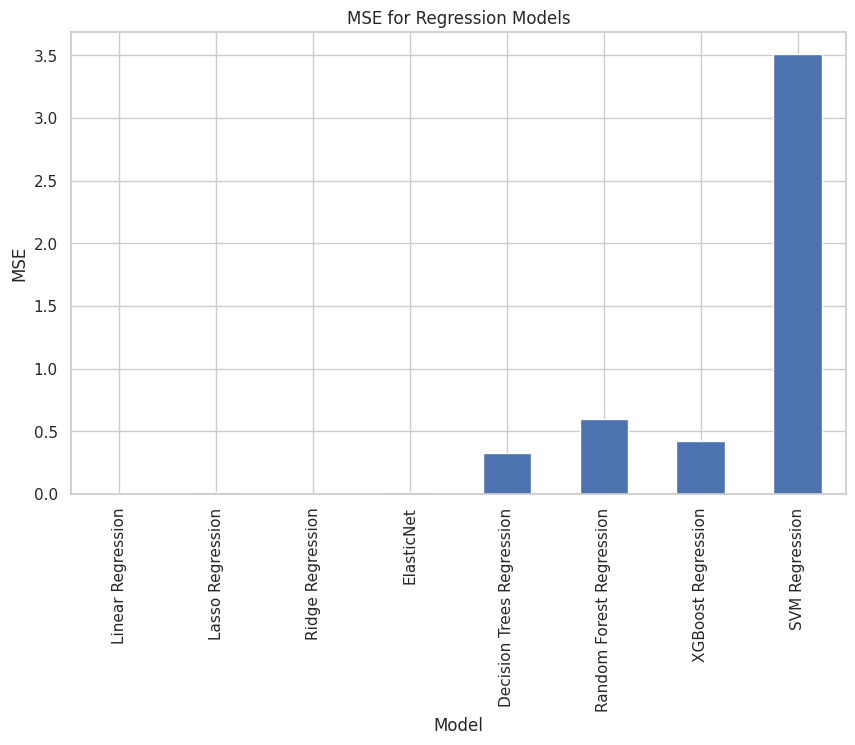

In [ ]:
# create a dictionary to store the R-squared and MSE for each model
results_1 = {'Linear Regression': [lr_r2_1, lr_mse_1],
           'Lasso Regression': [lasso_r2_1, lasso_mse_1],
           'Ridge Regression': [ridge_r2_1, ridge_mse_1],
           'ElasticNet': [en_r2_1, en_mse_1],
           'Decision Trees Regression': [dt_r2_1, dt_mse_1],
           'Random Forest Regression': [rf_r2_1, rf_mse_1],
           'XGBoost Regression': [xgb_r2_1, xgb_mse_1],
           'SVM Regression': [svr_r2_1, svr_mse_1]}

# convert the dictionary to a pandas DataFrame
results_df = pd.DataFrame.from_dict(results_1, orient='index', columns=['R-squared', 'MSE'])

# create a bar plot of the R-squared values
ax = results_df['R-squared'].plot(kind='bar', figsize=(10,6))
ax.set_title('R-squared for Regression Models')
ax.set_xlabel('Model')
ax.set_ylabel('R-squared')
plt.show()

# create a bar plot of the MSE values
ax = results_df['MSE'].plot(kind='bar', figsize=(10,6))
ax.set_title('MSE for Regression Models')
ax.set_xlabel('Model')
ax.set_ylabel('MSE')
plt.show()


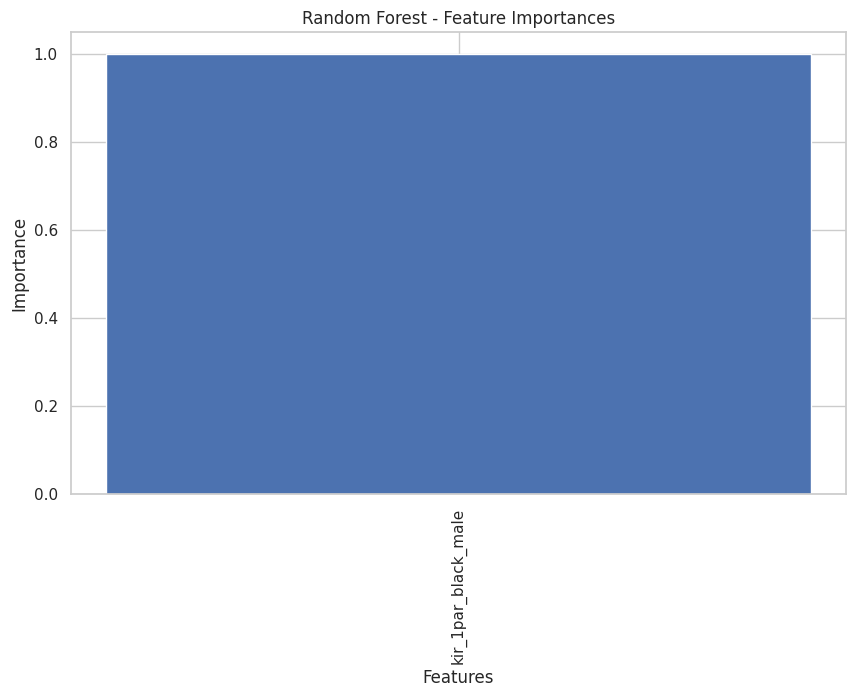

In [ ]:
X_1 = data[['kir_1par_black_male']]
y_1 = data['kir_black_male']
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor(random_state=42)
rfr.fit(X_1, y_1)

# Get feature importances from Random Forest Regressor
rfr_importances = rfr.feature_importances_
rfr_feature_names = X_1.columns

# Sort feature importances in descending order
rfr_indices = np.argsort(rfr_importances)[::-1]

# Visualize feature importances
plt.figure(figsize=(10, 6))
plt.title("Random Forest - Feature Importances")
plt.bar(range(len(rfr_importances)), rfr_importances[rfr_indices])
plt.xticks(range(len(rfr_importances)), rfr_feature_names[rfr_indices], rotation='vertical')
plt.xlabel("Features")
plt.ylabel("Importance")
plt.show()


#### Regression Model 2
How does Black vs. White Father Presence impact on mean child individual income rank for black males?

In [ ]:
#PREDICTION MODEL 2:

# split the data into features and target variable
X_2 = data[['kir_1par_black_male', 'kir_1par_white_male']]
y_2 = data['kir_black_male']

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_2, y_2, test_size=0.2, random_state=42)
# 20% of  test size
# 80% of train size
# use 80% of the train to Training Set: This is used to train or fit the model. It includes both the input data (features) and the expected output (target). The model learns to map the input to the output using this set.
#Testing Set: This is used to evaluate the model’s performance. It also includes both the input data and the expected output, but this data is not used during the training phase. The idea is to test how well the model can generalize to new, unseen data.


# define the models
lr = LinearRegression()
lasso = Lasso(alpha=0.1)
ridge = Ridge(alpha=0.1)
en = ElasticNet(alpha=0.1)
dt = DecisionTreeRegressor(random_state=42)
rf = RandomForestRegressor(random_state=42)
xgb = XGBRegressor(random_state=42)
svr = SVR()

# fit the models
lr.fit(X_train, y_train)
lasso.fit(X_train, y_train)
ridge.fit(X_train, y_train)
en.fit(X_train, y_train)
dt.fit(X_train, y_train)
rf.fit(X_train, y_train)
xgb.fit(X_train, y_train)
svr.fit(X_train, y_train)

# predict the target variable for test set using the models
lr_pred = lr.predict(X_test)
lasso_pred = lasso.predict(X_test)
ridge_pred = ridge.predict(X_test)
en_pred = en.predict(X_test)
dt_pred = dt.predict(X_test)
rf_pred = rf.predict(X_test)
xgb_pred = xgb.predict(X_test)
svr_pred = svr.predict(X_test)

# calculate r-squared and mean squared error for the models
lr_r2_2 = r2_score(y_test, lr_pred)
lr_mse_2 = mean_squared_error(y_test, lr_pred)

lasso_r2_2 = r2_score(y_test, lasso_pred)
lasso_mse_2 = mean_squared_error(y_test, lasso_pred)

ridge_r2_2 = r2_score(y_test, ridge_pred)
ridge_mse_2 = mean_squared_error(y_test, ridge_pred)

en_r2_2 = r2_score(y_test, en_pred)
en_mse_2 = mean_squared_error(y_test, en_pred)

dt_r2_2 = r2_score(y_test, dt_pred)
dt_mse_2 = mean_squared_error(y_test, dt_pred)

rf_r2_2 = r2_score(y_test, rf_pred)
rf_mse_2 = mean_squared_error(y_test, rf_pred)

xgb_r2_2 = r2_score(y_test, xgb_pred)
xgb_mse_2 = mean_squared_error(y_test, xgb_pred)

svr_r2_2 = r2_score(y_test, svr_pred)
svr_mse_2 = mean_squared_error(y_test, svr_pred)

# print the r-squared and mean squared error for the models
print("Linear Regression R-squared: {:.3f}, MSE: {:.3f}".format(lr_r2_2, lr_mse_2))
print("Lasso Regression R-squared: {:.3f}, MSE: {:.3f}".format(lasso_r2_2, lasso_mse_2))
print("Ridge Regression R-squared: {:.3f}, MSE: {:.3f}".format(ridge_r2_2, ridge_mse_2))
print("ElasticNet R-squared: {:.3f}, MSE: {:.3f}".format(en_r2_2, en_mse_2))
print("Decision Trees Regression R-squared: {:.3f}, MSE: {:.3f}".format(dt_r2_2, dt_mse_2))
print("Random Forest Regression R-squared: {:.3f}, MSE: {:.3f}".format(rf_r2_2, rf_mse_2))
print("XGBoost Regression R-squared: {:.3f}, MSE: {:.3f}".format(xgb_r2_2, xgb_mse_2))
print("SVM Regression R-squared: {:.3f}, MSE: {:.3f}".format(svr_r2_2, svr_mse_2))

Linear Regression R-squared: 0.999, MSE: 0.006
Lasso Regression R-squared: 0.999, MSE: 0.009
Ridge Regression R-squared: 1.000, MSE: 0.004
ElasticNet R-squared: 0.998, MSE: 0.016
Decision Trees Regression R-squared: 0.964, MSE: 0.351
Random Forest Regression R-squared: 0.938, MSE: 0.611
XGBoost Regression R-squared: 0.957, MSE: 0.426
SVM Regression R-squared: 0.770, MSE: 2.265


[29.45 30.66 31.7  32.36 33.02 33.56 33.81 34.43 34.68 35.22 35.5  35.9
 36.43 36.2  36.59 36.72 37.35 37.4  37.77 37.97 38.06 38.29 38.75 38.49
 39.06]
Unique values in y_2 after conversion: [1]
Categories (2, int64): [0 < 1]


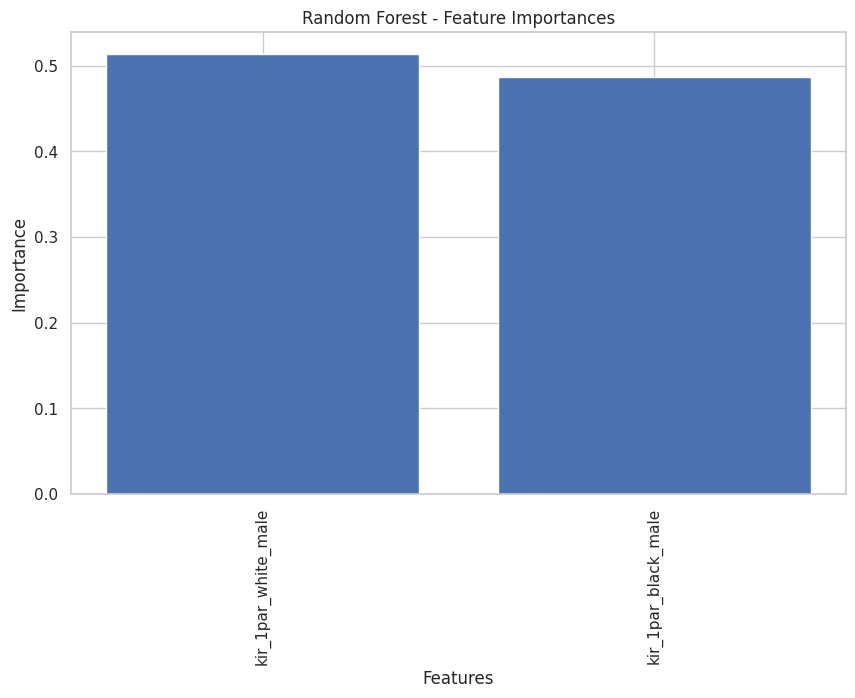

In [ ]:
# Check the unique values in y_2
print(y_2.unique())

if y_2.dtype.kind in 'fc':  # If y_2 is float or complex
    y_2 = pd.cut(y_2, bins=[-np.inf, 0.5, np.inf], labels=[0, 1])
elif y_2.dtype.kind in 'i':  # If y_2 is integer
    y_2 = y_2.astype('category')

# Verify the conversion
print("Unique values in y_2 after conversion:", y_2.unique())

# Now fit the model
rfc = RandomForestClassifier()
rfc.fit(X_2, y_2)

# Feature importances from Random Forest
rf_importances = rf.feature_importances_
rf_feature_names = X_train.columns

# Sort feature importances in descending order
rf_indices = np.argsort(rf_importances)[::-1]

# Visualize feature importances for Random Forest
plt.figure(figsize=(10, 6))
plt.title("Random Forest - Feature Importances")
plt.bar(range(len(rf_importances)), rf_importances[rf_indices])
plt.xticks(range(len(rf_importances)), rf_feature_names[rf_indices], rotation='vertical')
plt.xlabel("Features")
plt.ylabel("Importance")
plt.show()

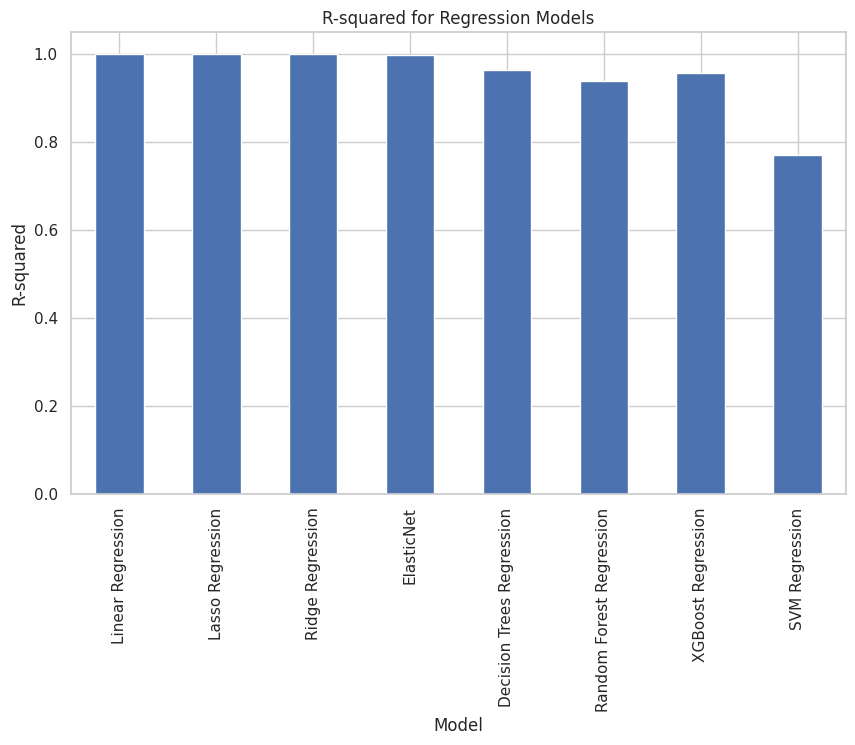

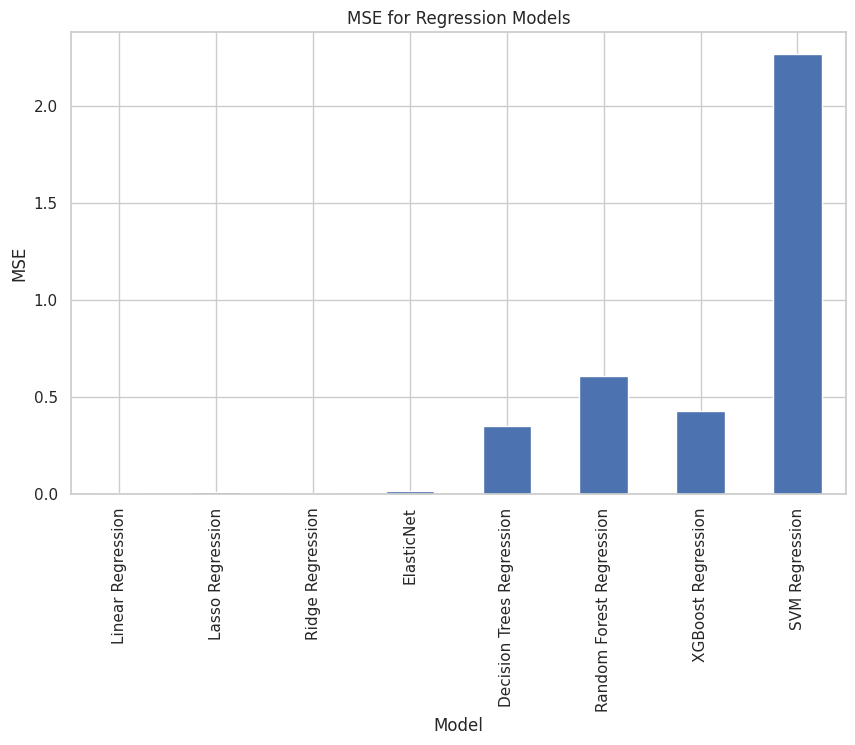

In [ ]:
# create a dictionary to store the R-squared and MSE for each model
results_2 = {'Linear Regression': [lr_r2_2, lr_mse_2],
           'Lasso Regression': [lasso_r2_2, lasso_mse_2],
           'Ridge Regression': [ridge_r2_2, ridge_mse_2],
           'ElasticNet': [en_r2_2, en_mse_2],
           'Decision Trees Regression': [dt_r2_2, dt_mse_2],
           'Random Forest Regression': [rf_r2_2, rf_mse_2],
           'XGBoost Regression': [xgb_r2_2, xgb_mse_2],
           'SVM Regression': [svr_r2_2, svr_mse_2]}

# convert the dictionary to a pandas DataFrame
results_df = pd.DataFrame.from_dict(results_2, orient='index', columns=['R-squared', 'MSE'])

# create a bar plot of the R-squared values
ax = results_df['R-squared'].plot(kind='bar', figsize=(10,6))
ax.set_title('R-squared for Regression Models')
ax.set_xlabel('Model')
ax.set_ylabel('R-squared')
plt.show()

# create a bar plot of the MSE values
ax = results_df['MSE'].plot(kind='bar', figsize=(10,6))
ax.set_title('MSE for Regression Models')
ax.set_xlabel('Model')
ax.set_ylabel('MSE')
plt.show()


#### Regression Model 3
How does Black Fathers per Child impact on mean child individual income rank for black males?

Linear Regression R-squared: 1.000, MSE: 0.003
Lasso Regression R-squared: 0.998, MSE: 0.020
Ridge Regression R-squared: 1.000, MSE: 0.002
ElasticNet R-squared: 1.000, MSE: 0.004
Decision Trees Regression R-squared: 0.955, MSE: 0.447
Random Forest Regression R-squared: 0.935, MSE: 0.642
XGBoost Regression R-squared: 0.956, MSE: 0.431
SVM Regression R-squared: 0.616, MSE: 3.781


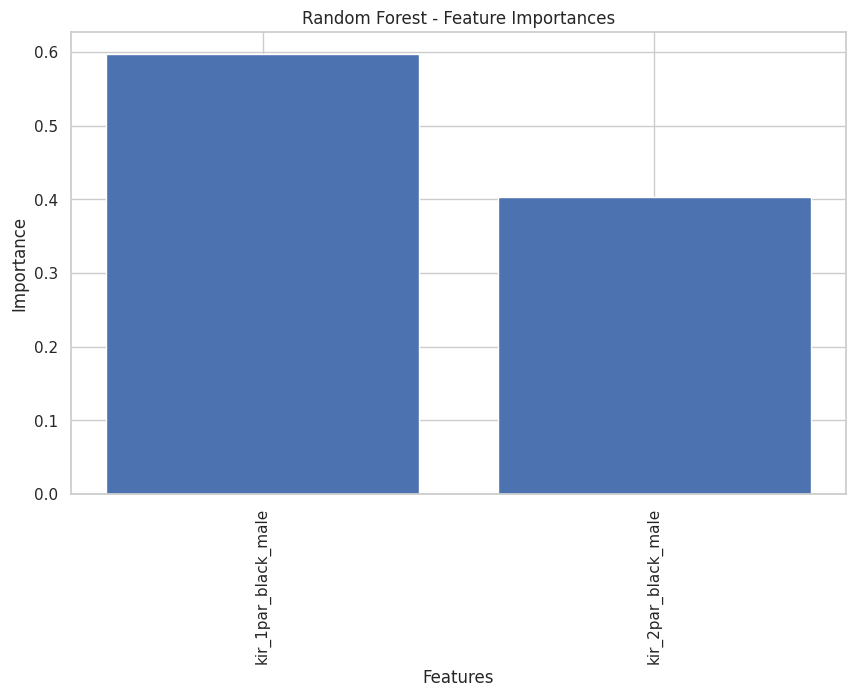

In [ ]:
#PREDICTION MODEL 3:

# split the data into features and target variable
X = data[['kir_1par_black_male', 'kir_2par_black_male']]
y = data['kir_black_male']

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# 20% of  test size
# 80% of train size
# use 80% of the train to Training Set: This is used to train or fit the model. It includes both the input data (features) and the expected output (target). The model learns to map the input to the output using this set.
#Testing Set: This is used to evaluate the model’s performance. It also includes both the input data and the expected output, but this data is not used during the training phase. The idea is to test how well the model can generalize to new, unseen data.

# define the models
lr = LinearRegression()
lasso = Lasso(alpha=0.1)
ridge = Ridge(alpha=0.1)
en = ElasticNet(alpha=0.1)
dt = DecisionTreeRegressor(random_state=42)
rf = RandomForestRegressor(random_state=42)
xgb = XGBRegressor(random_state=42)
svr = SVR()

# fit the models
lr.fit(X_train, y_train)
lasso.fit(X_train, y_train)
ridge.fit(X_train, y_train)
en.fit(X_train, y_train)
dt.fit(X_train, y_train)
rf.fit(X_train, y_train)
xgb.fit(X_train, y_train)
svr.fit(X_train, y_train)

# predict the target variable for test set using the models
lr_pred = lr.predict(X_test)
lasso_pred = lasso.predict(X_test)
ridge_pred = ridge.predict(X_test)
en_pred = en.predict(X_test)
dt_pred = dt.predict(X_test)
rf_pred = rf.predict(X_test)
xgb_pred = xgb.predict(X_test)
svr_pred = svr.predict(X_test)

# calculate r-squared and mean squared error for the models
lr_r2_3 = r2_score(y_test, lr_pred)
lr_mse_3 = mean_squared_error(y_test, lr_pred)

lasso_r2_3 = r2_score(y_test, lasso_pred)
lasso_mse_3 = mean_squared_error(y_test, lasso_pred)

ridge_r2_3 = r2_score(y_test, ridge_pred)
ridge_mse_3 = mean_squared_error(y_test, ridge_pred)

en_r2_3 = r2_score(y_test, en_pred)
en_mse_3 = mean_squared_error(y_test, en_pred)

dt_r2_3 = r2_score(y_test, dt_pred)
dt_mse_3 = mean_squared_error(y_test, dt_pred)

rf_r2_3 = r2_score(y_test, rf_pred)
rf_mse_3 = mean_squared_error(y_test, rf_pred)

xgb_r2_3 = r2_score(y_test, xgb_pred)
xgb_mse_3 = mean_squared_error(y_test, xgb_pred)

svr_r2_3 = r2_score(y_test, svr_pred)
svr_mse_3 = mean_squared_error(y_test, svr_pred)

# print the r-squared and mean squared error for the models
print("Linear Regression R-squared: {:.3f}, MSE: {:.3f}".format(lr_r2_3, lr_mse_3))
print("Lasso Regression R-squared: {:.3f}, MSE: {:.3f}".format(lasso_r2_3, lasso_mse_3))
print("Ridge Regression R-squared: {:.3f}, MSE: {:.3f}".format(ridge_r2_3, ridge_mse_3))
print("ElasticNet R-squared: {:.3f}, MSE: {:.3f}".format(en_r2_3, en_mse_3))
print("Decision Trees Regression R-squared: {:.3f}, MSE: {:.3f}".format(dt_r2_3, dt_mse_3))
print("Random Forest Regression R-squared: {:.3f}, MSE: {:.3f}".format(rf_r2_3, rf_mse_3))
print("XGBoost Regression R-squared: {:.3f}, MSE: {:.3f}".format(xgb_r2_3, xgb_mse_3))
print("SVM Regression R-squared: {:.3f}, MSE: {:.3f}".format(svr_r2_3, svr_mse_3))

# Feature importances from Random Forest
rf_importances = rf.feature_importances_
rf_feature_names = X_train.columns

# Sort feature importances in descending order
rf_indices = np.argsort(rf_importances)[::-1]

# Visualize feature importances for Random Forest
plt.figure(figsize=(10, 6))
plt.title("Random Forest - Feature Importances")
plt.bar(range(len(rf_importances)), rf_importances[rf_indices])
plt.xticks(range(len(rf_importances)), rf_feature_names[rf_indices], rotation='vertical')
plt.xlabel("Features")
plt.ylabel("Importance")
plt.show()

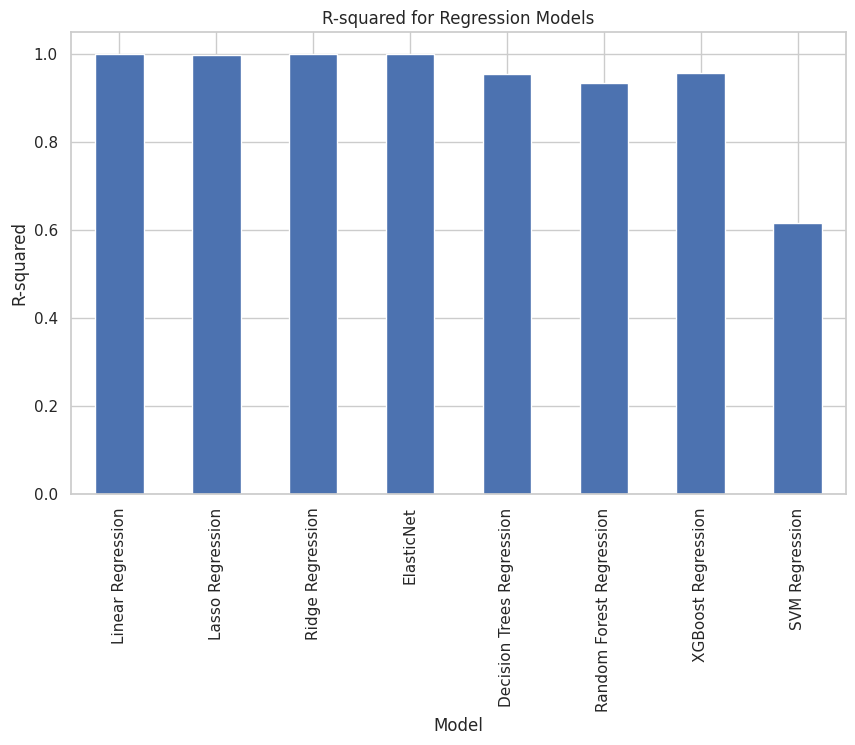

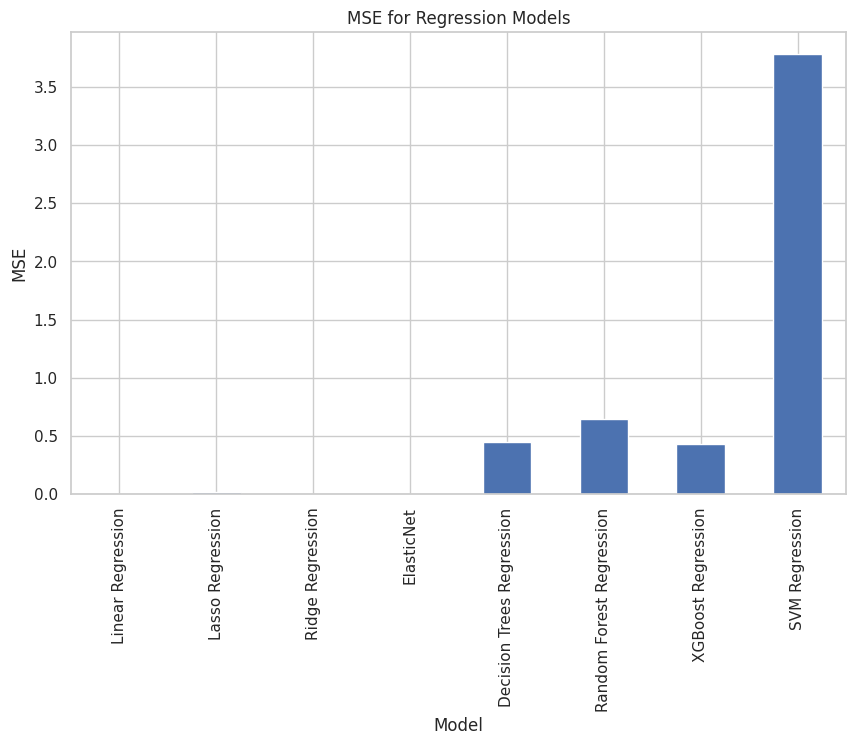

In [ ]:
# create a dictionary to store the R-squared and MSE for each model
results_3 = {'Linear Regression': [lr_r2_3, lr_mse_3],
           'Lasso Regression': [lasso_r2_3, lasso_mse_3],
           'Ridge Regression': [ridge_r2_3, ridge_mse_3],
           'ElasticNet': [en_r2_3, en_mse_3],
           'Decision Trees Regression': [dt_r2_3, dt_mse_3],
           'Random Forest Regression': [rf_r2_3, rf_mse_3],
           'XGBoost Regression': [xgb_r2_3, xgb_mse_3],
           'SVM Regression': [svr_r2_3, svr_mse_3]}

# convert the dictionary to a pandas DataFrame
results_df = pd.DataFrame.from_dict(results_3, orient='index', columns=['R-squared', 'MSE'])

# create a bar plot of the R-squared values
ax = results_df['R-squared'].plot(kind='bar', figsize=(10,6))
ax.set_title('R-squared for Regression Models')
ax.set_xlabel('Model')
ax.set_ylabel('R-squared')
plt.show()

# create a bar plot of the MSE values
ax = results_df['MSE'].plot(kind='bar', figsize=(10,6))
ax.set_title('MSE for Regression Models')
ax.set_xlabel('Model')
ax.set_ylabel('MSE')
plt.show()


#### Regression Model 4
How does Low-Income Children Two Parents impact on mean child individual income rank for black males?

Linear Regression R-squared: 0.999, MSE: 0.006
Lasso Regression R-squared: 0.998, MSE: 0.021
Ridge Regression R-squared: 1.000, MSE: 0.005
ElasticNet R-squared: 0.999, MSE: 0.012
Decision Trees Regression R-squared: 0.955, MSE: 0.447
Random Forest Regression R-squared: 0.939, MSE: 0.597
XGBoost Regression R-squared: 0.957, MSE: 0.425
SVM Regression R-squared: 0.819, MSE: 1.786


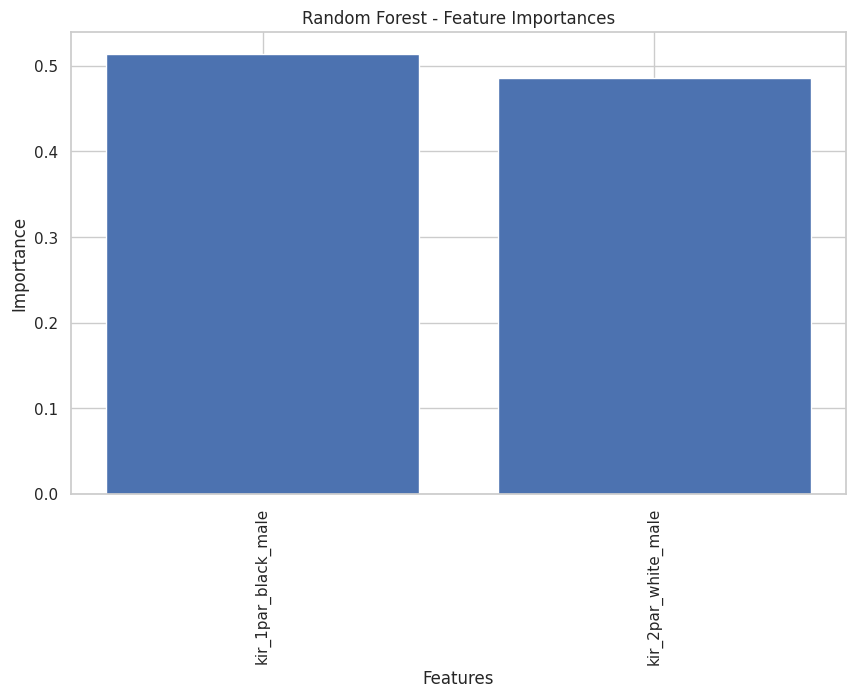

In [ ]:
#PREDICTION MODEL 4:

# split the data into features and target variable
X = data[['kir_1par_black_male', 'kir_2par_white_male']]
y = data['kir_black_male']

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# 20% of  test size
# 80% of train size
# use 80% of the train to Training Set: This is used to train or fit the model. It includes both the input data (features) and the expected output (target). The model learns to map the input to the output using this set.
#Testing Set: This is used to evaluate the model’s performance. It also includes both the input data and the expected output, but this data is not used during the training phase. The idea is to test how well the model can generalize to new, unseen data.


# define the models
lr = LinearRegression()
lasso = Lasso(alpha=0.1)
ridge = Ridge(alpha=0.1)
en = ElasticNet(alpha=0.1)
dt = DecisionTreeRegressor(random_state=42)
rf = RandomForestRegressor(random_state=42)
xgb = XGBRegressor(random_state=42)
svr = SVR()

# fit the models
lr.fit(X_train, y_train)
lasso.fit(X_train, y_train)
ridge.fit(X_train, y_train)
en.fit(X_train, y_train)
dt.fit(X_train, y_train)
rf.fit(X_train, y_train)
xgb.fit(X_train, y_train)
svr.fit(X_train, y_train)

# predict the target variable for test set using the models
lr_pred = lr.predict(X_test)
lasso_pred = lasso.predict(X_test)
ridge_pred = ridge.predict(X_test)
en_pred = en.predict(X_test)
dt_pred = dt.predict(X_test)
rf_pred = rf.predict(X_test)
xgb_pred = xgb.predict(X_test)
svr_pred = svr.predict(X_test)

# calculate r-squared and mean squared error for the models
lr_r2_4 = r2_score(y_test, lr_pred)
lr_mse_4 = mean_squared_error(y_test, lr_pred)

lasso_r2_4 = r2_score(y_test, lasso_pred)
lasso_mse_4 = mean_squared_error(y_test, lasso_pred)

ridge_r2_4 = r2_score(y_test, ridge_pred)
ridge_mse_4 = mean_squared_error(y_test, ridge_pred)

en_r2_4 = r2_score(y_test, en_pred)
en_mse_4 = mean_squared_error(y_test, en_pred)

dt_r2_4 = r2_score(y_test, dt_pred)
dt_mse_4 = mean_squared_error(y_test, dt_pred)

rf_r2_4 = r2_score(y_test, rf_pred)
rf_mse_4 = mean_squared_error(y_test, rf_pred)

xgb_r2_4 = r2_score(y_test, xgb_pred)
xgb_mse_4 = mean_squared_error(y_test, xgb_pred)

svr_r2_4 = r2_score(y_test, svr_pred)
svr_mse_4 = mean_squared_error(y_test, svr_pred)

# print the r-squared and mean squared error for the models
print("Linear Regression R-squared: {:.3f}, MSE: {:.3f}".format(lr_r2_4, lr_mse_4))
print("Lasso Regression R-squared: {:.3f}, MSE: {:.3f}".format(lasso_r2_4, lasso_mse_4))
print("Ridge Regression R-squared: {:.3f}, MSE: {:.3f}".format(ridge_r2_4, ridge_mse_4))
print("ElasticNet R-squared: {:.3f}, MSE: {:.3f}".format(en_r2_4, en_mse_4))
print("Decision Trees Regression R-squared: {:.3f}, MSE: {:.3f}".format(dt_r2_4, dt_mse_4))
print("Random Forest Regression R-squared: {:.3f}, MSE: {:.3f}".format(rf_r2_4, rf_mse_4))
print("XGBoost Regression R-squared: {:.3f}, MSE: {:.3f}".format(xgb_r2_4, xgb_mse_4))
print("SVM Regression R-squared: {:.3f}, MSE: {:.3f}".format(svr_r2_4, svr_mse_4))

# Feature importances from Random Forest
rf_importances = rf.feature_importances_
rf_feature_names = X_train.columns

# Sort feature importances in descending order
rf_indices = np.argsort(rf_importances)[::-1]

# Visualize feature importances for Random Forest
plt.figure(figsize=(10, 6))
plt.title("Random Forest - Feature Importances")
plt.bar(range(len(rf_importances)), rf_importances[rf_indices])
plt.xticks(range(len(rf_importances)), rf_feature_names[rf_indices], rotation='vertical')
plt.xlabel("Features")
plt.ylabel("Importance")
plt.show()

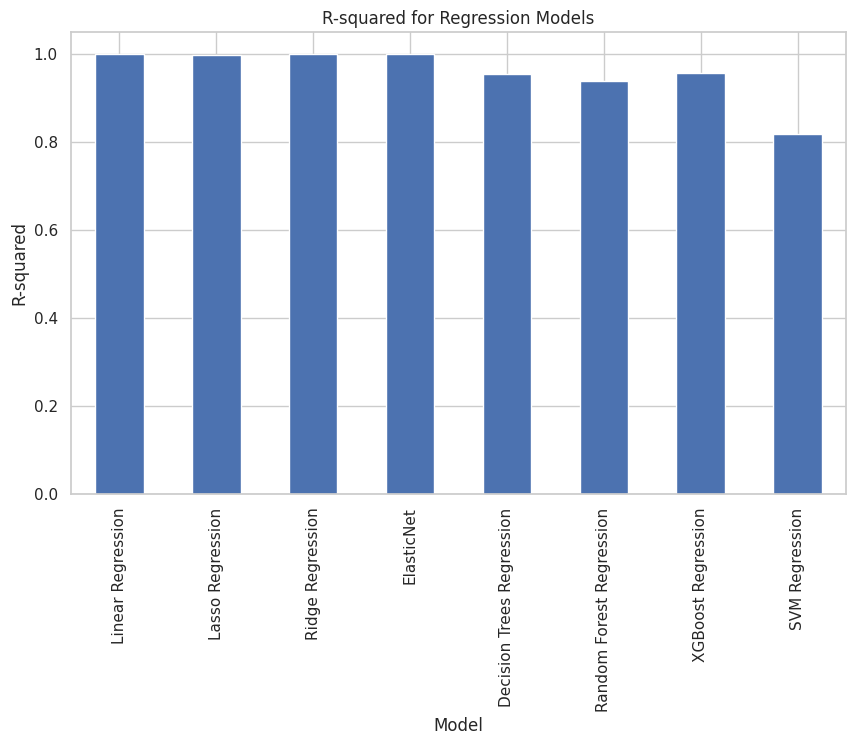

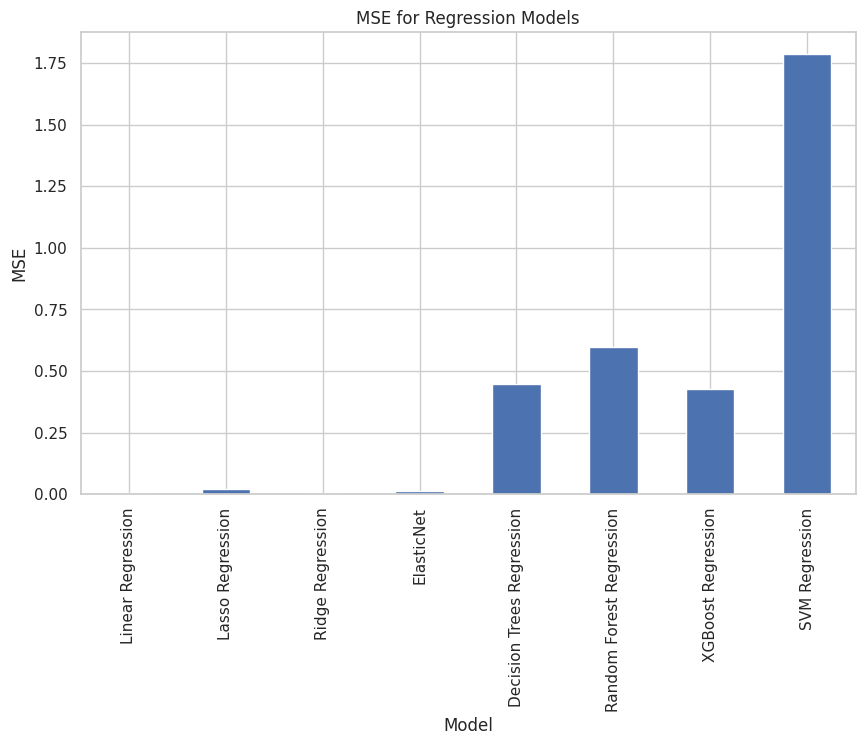

In [ ]:
# create a dictionary to store the R-squared and MSE for each model
results_4 = {'Linear Regression': [lr_r2_4, lr_mse_4],
           'Lasso Regression': [lasso_r2_4, lasso_mse_4],
           'Ridge Regression': [ridge_r2_4, ridge_mse_4],
           'ElasticNet': [en_r2_4, en_mse_4],
           'Decision Trees Regression': [dt_r2_4, dt_mse_4],
           'Random Forest Regression': [rf_r2_4, rf_mse_4],
           'XGBoost Regression': [xgb_r2_4, xgb_mse_4],
           'SVM Regression': [svr_r2_4, svr_mse_4]}

# convert the dictionary to a pandas DataFrame
results_df = pd.DataFrame.from_dict(results_4, orient='index', columns=['R-squared', 'MSE'])

# create a bar plot of the R-squared values
ax = results_df['R-squared'].plot(kind='bar', figsize=(10,6))
ax.set_title('R-squared for Regression Models')
ax.set_xlabel('Model')
ax.set_ylabel('R-squared')
plt.show()

# create a bar plot of the MSE values
ax = results_df['MSE'].plot(kind='bar', figsize=(10,6))
ax.set_title('MSE for Regression Models')
ax.set_xlabel('Model')
ax.set_ylabel('MSE')
plt.show()


## Interpretation and Conclusions

We took data from the original paper, which compared social mobility across races and immigration status in the United States. We used the data to build a regression model that predicts the income rank of black males similarly to Table II found in the original paper. The feature importance plot from the Random Forest model indicates that both kir_1par_black_male and kir_2par_black_male have nearly equal importance in predicting the income rank of black males. This suggests that the presence of either one or two parents significantly influences the income outcomes for black males.

The OLS regression results show a high R-squared value (0.999), indicating that the model accounts for nearly all the variability in the income rank of black males. The coefficient for `kir_1par_black_male` is 1.0233, which is highly significant (p-value < 0.001). This implies that, holding other factors constant, the presence of one parent could be associated with a 1.0233 increase in the income rank of black males. However, we understand that the data we were working with was limited and such a high value likely indicates that the model is overfitting the data, capturing noise rather than the underlying relationship.

However, should our results have been reliable, the significant positive impact of parental presence on income rank, policymakers should invest in programs that support single-parent and two-parent families. This could include financial assistance, parenting support programs, and community resources aimed at strengthening family units. Understanding the factors that influence the income rank of black males is crucial for addressing economic disparities. The results highlight the importance of family structure in economic outcomes, guiding policymakers in designing effective interventions to foster socio-economic mobility and reduce income inequality.

To dive further into the caveats, one thing we as a group noticed once we were far too deep into the modeling is that we can be restricted by the data the original authors used. Most of the tables were not mergable, and we were largely restricted to one dataset per predictive question. As we began creating a predictive model to estimate income rank of black children depending on parental presence, we quickly realized that we were missing essential data that could not be pulled from other tables. The fact that this paper largely analyzed existing statistics provided by the government, across different years and across different states, was a big reason for our lack of success. We could not create an accurate predictive model as this paper largely used this data to highlight discrepencies in social mobility across different races in America.

Further, I'd like to draw attention to the R-squared plots. The chart displays the R-squared values for various regression models used to predict the income rank of black males. Most models, including Linear Regression, Lasso Regression, Ridge Regression, and ElasticNet, show R-squared values close to 1, indicating a high degree of explained variability. Decision Trees, Random Forest, and XGBoost models also show high R-squared values, suggesting they fit the data well. However, the SVM Regression model has a noticeably lower R-squared value, indicating it explains less variability in the income rank. These consistently high R-squared values across different models suggest potential overfitting, especially given the limitations in the dataset. This reinforces the need for careful evaluation and inclusion of additional relevant variables to avoid misleading conclusions.

## Post-Analysis Reproducibility

You will need to make sure that your code can be run by another team and by us.  This will mean making sure that all steps run in sequence, and hopefully that all the datasets are easily read via file paths.

We are anticipating that the easiest way to share will be via Google Colab. You are welcome to work on Datahub, on your local install, or any way you like.  However you will be expected to make sure that your complete notebook can run on Colab at the end of the project.  Please keep this in mind and save time to fiddle with things so it works!


Please share your Google Colab (or equivalent) link in this [sheet](https://docs.google.com/spreadsheets/d/15oNmFwpjSHifnyPvJJ8Gv3ECNOPKHsIWvvt0EbkyXVU/edit?usp=sharing). Each group will be assigned another group's link randomly (in the same sheet) to review and run without issues. Please confirm and leave comments about issues about this in the sheet as well.

This part is to ensure that we're building replicable and reusable code. Please refer to [section 9](https://docs.google.com/presentation/d/12eIuPKYZ8PMysm0pSxoClnh4YOQFRqHO6qVv2SN23Xc/edit?usp=share_link) for best practices of this.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=571cdd9f-8bcf-4f0b-9668-d2ee40b17d7d' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>